In [1]:
import os
import glob
import grizli
import grizli.utils

In [2]:
# General imports
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
#mpl.rcParams["figure.figsize"] = (16,7) # big images
mpl.rcParams["image.interpolation"] = "nearest" # no smoothing/blurring
mpl.rcParams["image.origin"] = "lower" 

from astropy.io import fits
from astropy.table import Table
from tqdm import tqdm
import os

# Spectra tools
import pysynphot as S
import webbpsf

/Users/ross.1333/anaconda3/envs/grizli39/lib/python3.9/site-packages/pysynphot/locations.py:345: UserWarning: Extinction files not found in /Users/ross.1333/pysyn_cdbs/extinction
  warnings.warn('Extinction files not found in %s' % (extdir, ))
/Users/ross.1333/anaconda3/envs/grizli39/lib/python3.9/site-packages/pysynphot/refs.py:117: UserWarning: No graph or component tables found; functionality will be SEVERELY crippled. No files found for /Users/ross.1333/pysyn_cdbs/mtab/*_tmg.fits
  warnings.warn('No graph or component tables found; '
/Users/ross.1333/anaconda3/envs/grizli39/lib/python3.9/site-packages/pysynphot/refs.py:124: UserWarning: No thermal tables found, no thermal calculations can be performed. No files found for /Users/ross.1333/pysyn_cdbs/mtab/*_tmt.fits
  warnings.warn('No thermal tables found, '


In [3]:
os.getcwd()

'/Users/ross.1333/Documents/GitHub/grizli'

In [3]:
roman_base_dir = os.getenv('HOME')+'/Dropbox/RomanGRS/products/'
direct_fits = roman_base_dir+"FOV0/roll_0/dither_0x_0y/SCA1/GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits"
grism_fits = roman_base_dir+"FOV0/roll_0/dither_0x_0y/SCA1/GRS_FOV0_roll0_dx0_dy0_SCA1_slitless_final.fits"
ready_fits = roman_base_dir+"FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits"
empty_seg = roman_base_dir+"FOV0/roll_0/dither_0x_0y/SCA1/empty_seg.fits"
empty_direct = roman_base_dir+"FOV0/roll_0/dither_0x_0y/SCA1/empty_direct.fits"

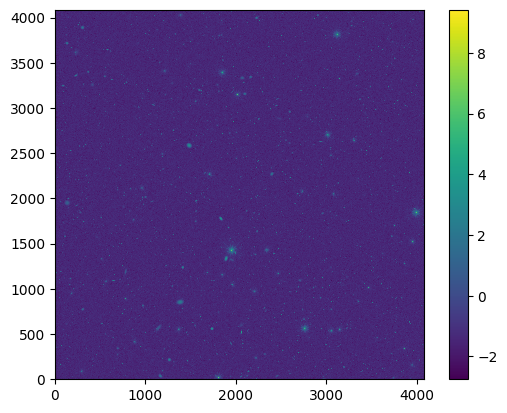

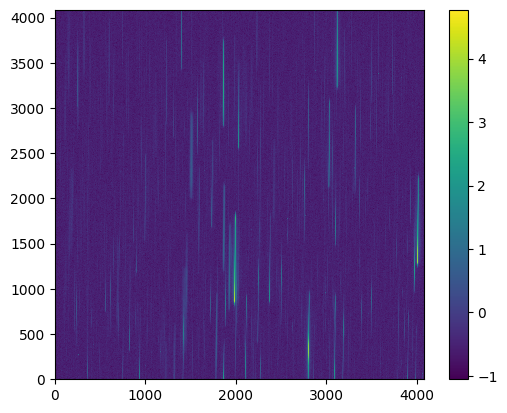

In [4]:
img = fits.open(direct_fits)[1].data
grism = fits.open(grism_fits)[1].data
plt.imshow(np.log(img))
plt.colorbar()
plt.show()

plt.imshow(np.log(grism))
plt.colorbar()
plt.show()

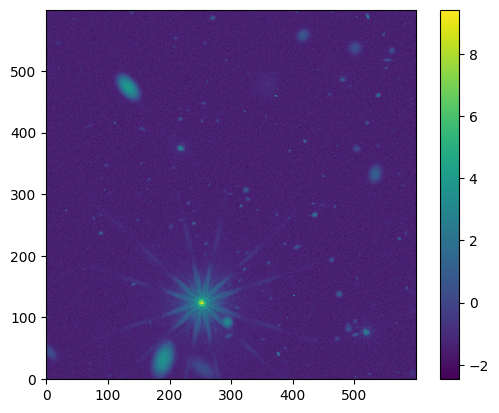

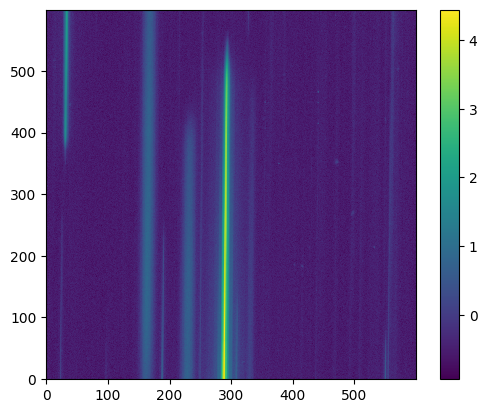

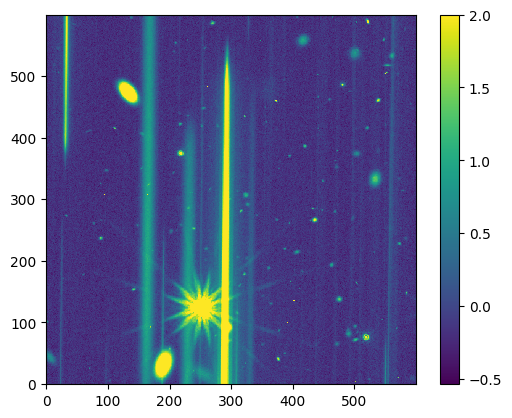

In [262]:
sz = 300
x0 = 2000
y0 = 1600
plt.imshow(np.log(img[y0-sz:y0+sz, x0-sz:x0+sz]))
plt.colorbar()
plt.show()

plt.imshow(np.log(grism[y0-sz:y0+sz, x0-sz:x0+sz]))
plt.colorbar()
plt.show()

plt.imshow(np.log((img+grism)[y0-sz:y0+sz, x0-sz:x0+sz]),vmax=2)
plt.colorbar()
plt.show()


In [5]:
file = fits.open(direct_fits)
#file[1].data = file[1].data
file[1].data = np.rot90(file[1].data, k=3) # np.rot90 rotates clockwise k times

file[0].header["INSTRUME"] = "ROMAN"
file[0].header["FILTER"] = "d1_"
file[1].header["CONFFILE"] = roman_base_dir+"configuration/Roman.det1.07242020.conf" # This had to be a path, not just a filename; otherwise, grizli can't find the sensitivity fits

file.writeto(ready_fits, overwrite=True)

file[1].data = np.zeros((4088,4088))

file.writeto(empty_direct, overwrite=True)

header = file[1].header # We need to copy this header info into the segmentation file

file.close()

In [6]:
import grizli.fake_image
ra, dec = 53.1592277508136, -27.782056346146
pa_aper = 128.589
background = 0.57
EXPTIME = 301 # 10 ks ~ 4 HST orbits
NEXP = 1     # divided between 10 exposures
h, wcs = grizli.fake_image.roman_header(ra=ra, dec=dec, pa_aper=pa_aper, naxis=(4088,4088))
grizli.fake_image.make_fake_image(h, output=roman_base_dir+'roman_empty.fits', exptime=EXPTIME, nexp=NEXP,background=background)


 [astropy.io.fits.verify]


[<astropy.io.fits.hdu.image.PrimaryHDU object at 0x1752f4310>, <astropy.io.fits.hdu.image.ImageHDU object at 0x1752faa30>, <astropy.io.fits.hdu.image.ImageHDU object at 0x1752fa7f0>, <astropy.io.fits.hdu.image.ImageHDU object at 0x174fba820>]

In [7]:
#fix header
file = fits.open(roman_base_dir+'roman_empty.fits')
file[1].header["CONFFILE"] = roman_base_dir+"configuration/Roman.det1.07242020.conf" # This had to be a path, not just a filename; otherwise, grizli can't find the sensitivity fits
file.writeto(roman_base_dir+'roman_empty.fits', overwrite=True)
file.close()

In [ ]:
empty_array = np.zeros((4088,4088)) # 4088x4088 detector shape
fits.writeto(empty_seg, data=empty_array, header=header, overwrite=True)

In [8]:
#construct a segmentation map from the direct image
#better would be to construct a segmentation "truth" map based on the input data
#copied from example here https://photutils.readthedocs.io/en/stable/segmentation.html#image-segmentation
from photutils.background import Background2D, MedianBackground
bkg_estimator = MedianBackground()
full_image = fits.open(direct_fits)[1].data
bkg = Background2D(full_image, (50, 50), filter_size=(3, 3),bkg_estimator=bkg_estimator)
full_image_bkgsub = full_image - bkg.background

In [9]:
threshold = 1.5 * bkg.background_rms
from photutils.segmentation import detect_sources
segment_map = detect_sources(full_image_bkgsub, threshold, npixels=10)

In [10]:
from photutils.segmentation import deblend_sources
segm_deblend = deblend_sources(full_image_bkgsub, segment_map,
                               npixels=10, nlevels=32, contrast=0.001,
                               progress_bar=False)

In [13]:
#Table containing input truth for direct image, I believe
hlss_tbl = Table.read(roman_base_dir+"FOV0/roll_0/dither_0x_0y/SCA1/MOT_SCA1_roll_0_dither_0x_0y_cut_zcut.txt", format="ascii")

In [14]:
# Keith seperated the table by Stars and Galaxies, and I sorted each part so the brightest objects are handled first (and the brightest objects will be the chosen ones for the seg map)
#hlss_tbl = hlss_tbl.group_by("MODIMAGE") # Seperates stars from galaxies
#hlss_tbl.groups[0].sort("MAG_F1500W")
#hlss_tbl.groups[1].sort("MAG_F1500W") 
#just sort by mag
hlss_tbl.sort("MAG_F1500W") 

In [267]:
hlss_tbl[0]

NUMBER,X_IMAGE,Y_IMAGE,A_IMAGE,B_IMAGE,THETA_IMAGE,MAG_F1500W,SPECTEMP,Z,MODIMAGE,MODIMAGE_1,MODIMAGE_2
int64,float64,float64,float64,float64,float64,float64,int64,float64,int64,float64,float64
110372,1483.2339,2581.3271,11.7312,9.4379,55.65,16.11,110372,0.083632,0,9.4755111,-0.7196574


In [12]:
#we get about 80% of the sources in the segmentation map
print(len(segm_deblend.labels),len(hlss_tbl))

8787 10763


In [31]:
segid = segm_deblend.labels[0]
~np.isin(segid,[segid,0])

False

In [15]:
segmap_db_val = segm_deblend.data
missed_ids = []
found_ids = []
found_segids = []
found_mags = []
for row in hlss_tbl:
    id = row["NUMBER"]
    #mag = object["MAG_F1500W"]
    #if mag < 18:
    #_is_star = object["MODIMAGE"]
    x_0 = row["X_IMAGE"] #+ 100 # Add 100 to account for padding
    y_0 = row["Y_IMAGE"] #+ 100 
    segid = segmap_db_val[int(y_0)][int(x_0)]
    if segid != 0 and ~np.isin(segid,found_segids):
        found_ids.append(id)
        found_segids.append(segid)
        found_mags.append(row["MAG_F1500W"])

In [16]:
mask = np.isin(segm_deblend.data,found_segids)
masked_seg = np.copy(segm_deblend.data)#segm_deblend.data[mask]
masked_seg[~mask] = 0

In [15]:
len(np.unique(masked_seg)),len(masked_seg)

(7716, 4088)

In [69]:
masked_seg.shape

(4088, 4088)

7715


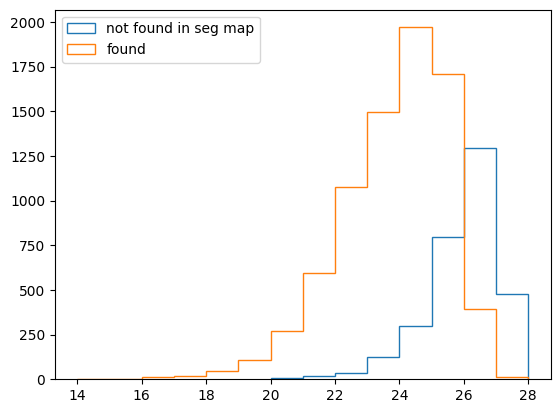

In [17]:
print(len(found_ids))
sel_found = np.isin(hlss_tbl['NUMBER'],found_ids)
plt.hist(hlss_tbl[~sel_found]["MAG_F1500W"],label='not found in seg map',bins=8,range=(20,28),histtype='step')
plt.hist(hlss_tbl[sel_found]["MAG_F1500W"],bins=14,range=(14,28),histtype='step',label='found')
plt.legend()
plt.show()

In [17]:
np.unique(hlss_tbl[~sel_found]["MODIMAGE"],return_counts=True)

(<Column name='MODIMAGE' dtype='int64' length=2>
 0
 1,
 array([2848,  200]))

In [18]:
# Prepare shape-defining equations
# GALAXY generic ellipse shape
A = lambda theta, a, b: ((np.sin(theta)**2)/(a**2)) + ((np.cos(theta)**2)/(b**2))
B = lambda theta, a, b: 2 * np.sin(theta) * np.cos(theta) * ((1/b**2) - (1/a**2))
C = lambda theta, a, b: ((np.sin(theta)**2)/(b**2)) + ((np.cos(theta)**2)/(a**2))

gen_ellipse = lambda x, y, x_0, y_0, ell: (A(*ell) * (x - x_0)**2) + (B(*ell) * (x - x_0) * (y - y_0)) + (C(*ell) * (y - y_0)**2)

# STAR generic circle shape
gen_circle = lambda x, y, x_0, y_0: (x-x_0)**2 + (y-y_0)**2

In [20]:
SED_dir = roman_base_dir+"FOV0/SEDs/" # Change to your path to directory containing SEDs

# Read in star spectrum
src = webbpsf.specFromSpectralType("G0V", catalog="phoenix")
wave = np.linspace(10000, 20000, 10000)
flux = src(wave).value
star_spec = S.ArraySpectrum(wave=wave, flux=flux, waveunits="angstroms", fluxunits="flam")

# Create F158 Filter Bandpass object
df = Table.read(os.path.join(SED_dir, "wfirst_wfi_f158_001_syn.fits"), format='fits')
bp = S.ArrayBandpass(df["WAVELENGTH"], df["THROUGHPUT"])

del wave
del flux
del df

In [21]:
from grizli.model import GrismFLT

pad = 100 # Objects near the edge of the segmentation map may have a trace with a center off of it. Padding ensures it will still disperse, otherwise, error about not finding segmentation id will be printed
roman = GrismFLT(grism_file=roman_base_dir+'roman_empty.fits',direct_file=ready_fits, seg_file=None, pad=pad)

In [22]:
padded_seg = np.pad(masked_seg, [pad, pad], mode='constant')

In [23]:
roman.seg = np.rot90(padded_seg, k=3).astype("float32")

In [24]:
roman.model *= 0
count = 0
for (segid,photid) in zip(found_segids,found_ids):
    sel_row = hlss_tbl['NUMBER'] == photid
    row = hlss_tbl[sel_row]
    mag = row["MAG_F1500W"][0]
    _is_star = row["MODIMAGE"][0]
    if _is_star:
        
        # Adjust spectrum scale using F158 Filter Bandpass object and star magnitude
        spec = star_spec.renorm(mag, "abmag", bp)
        spec.convert("flam")

    # GALAXY
    else: 

        # Read in unique Galaxy Spectrum
        sed_path = os.path.join(SED_dir, "SED:rest:gal.{0}.fits".format(row["SPECTEMP"][0]))
        spectrum = Table.read(sed_path, format="fits")
        wave = spectrum["wavelength"]
        flux = spectrum["flux"]
        z = row["Z"][0]

        spec = S.ArraySpectrum(wave=wave, flux=flux, waveunits="angstrom", fluxunits="flam").redshift(z)
        spec = spec.renorm(mag, "abmag", bp)
        spec.convert("flam")

    # By default, grizli trys to compute a cutout size. This cutout size is not large enough for the roman grism.
    # In 4) FOV0_sims/notebooks/dy-by-optimize.ipynb, I estimate the maximum needed size to be 77 for detector 1.
    # See that notebook for more details
    roman.compute_model_orders(id=segid, mag=mag, compute_size=False, size=77, in_place=True, store=False,
                               is_cgs=True, spectrum_1d=[spec.wave, spec.flux])
    count += 1
    if count%100 == 0:
        print('done with '+str(count)+' of '+str(len(found_segids)))

done with 100 of 7715
done with 200 of 7715
done with 300 of 7715
done with 400 of 7715
done with 500 of 7715
done with 600 of 7715
done with 700 of 7715
done with 800 of 7715
done with 900 of 7715
done with 1000 of 7715
done with 1100 of 7715
done with 1200 of 7715
done with 1300 of 7715
done with 1400 of 7715
done with 1500 of 7715
done with 1600 of 7715
done with 1700 of 7715
done with 1800 of 7715
done with 1900 of 7715
done with 2000 of 7715
done with 2100 of 7715
done with 2200 of 7715
done with 2300 of 7715
done with 2400 of 7715
done with 2500 of 7715
done with 2600 of 7715
done with 2700 of 7715
done with 2800 of 7715
done with 2900 of 7715
done with 3000 of 7715
done with 3100 of 7715
done with 3200 of 7715
done with 3300 of 7715
done with 3400 of 7715
done with 3500 of 7715
done with 3600 of 7715
done with 3700 of 7715
done with 3800 of 7715
done with 3900 of 7715
done with 4000 of 7715
done with 4100 of 7715
done with 4200 of 7715
done with 4300 of 7715
done with 4400 of 77

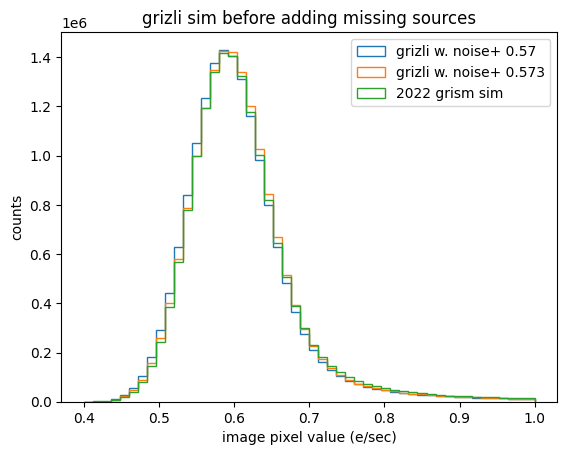

In [26]:
noise = np.random.normal(.573,.045,(4088,4088))
#noise = np.pad(noise,[100,100], mode='constant')
#plt.hist((roman.model[pad:-pad, pad:-pad]+noise).flatten(),range=(0.4,1),histtype='step',bins=50,label=r'grizli + 0.573$\pm$0.045 Gaussian')
plt.hist((roman.model[pad:-pad, pad:-pad]+roman.grism.data['SCI'][pad:-pad, pad:-pad]).flatten()+.57,range=(0.4,1),histtype='step',bins=50,label=r'grizli w. noise+ 0.57')
plt.hist((roman.model[pad:-pad, pad:-pad]+roman.grism.data['SCI'][pad:-pad, pad:-pad]).flatten()+.573,range=(0.4,1),histtype='step',bins=50,label=r'grizli w. noise+ 0.573')

#plt.hist((roman.grism.data['SCI'][pad:-pad, pad:-pad]).flatten()+.57,range=(0.4,1),histtype='step',bins=50,label=r'grizli noise only+ 0.57')

plt.hist(grism.flatten(),range=(0.4,1),histtype='step',bins=50,label='2022 grism sim')
plt.xlabel('image pixel value (e/sec)')
plt.ylabel('counts')
plt.title('grizli sim before adding missing sources')
plt.legend()
plt.show()

In [27]:
grism_mod_show = np.rot90(roman.model[pad:-pad, pad:-pad])
grism_mod_wnoise_show = np.rot90(roman.model[pad:-pad, pad:-pad]+roman.grism.data['SCI'][pad:-pad, pad:-pad])

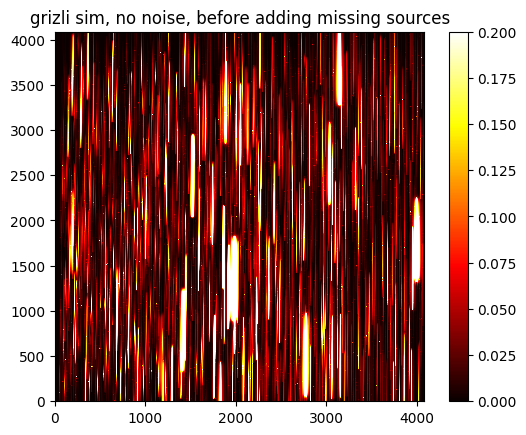

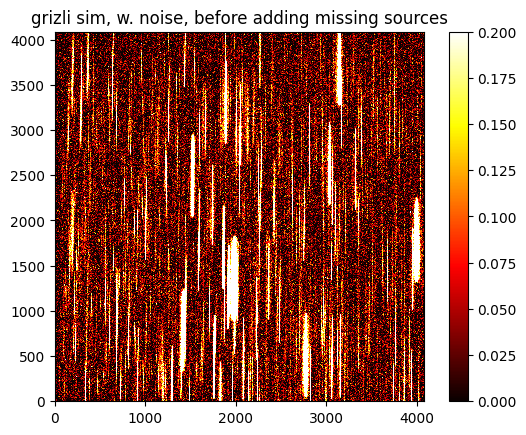

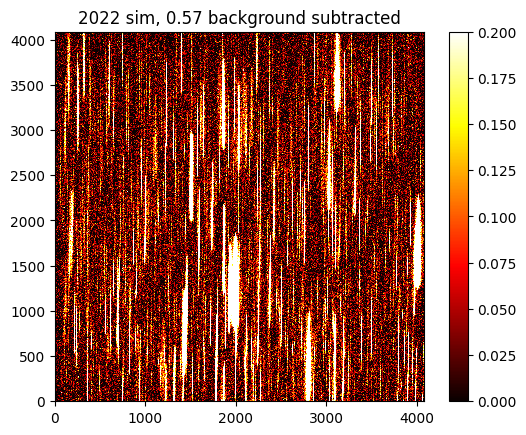

In [30]:
plt.imshow(grism_mod_show, vmin=0, vmax=0.2, cmap="hot")
plt.colorbar()
plt.title('grizli sim, no noise, before adding missing sources')
plt.show()
plt.imshow(grism_mod_wnoise_show, vmin=0, vmax=0.2, cmap="hot")
plt.colorbar()
plt.title('grizli sim, w. noise, before adding missing sources')
plt.show()

grism = fits.open(grism_fits)[1].data
plt.imshow(grism-.57, vmin=0, vmax=0.2, cmap="hot")
plt.colorbar()
plt.title('2022 sim, 0.57 background subtracted')
plt.show()

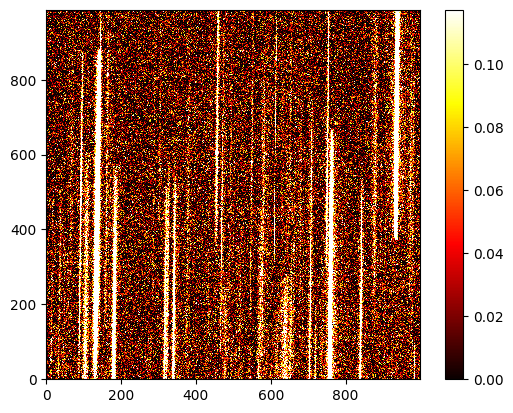

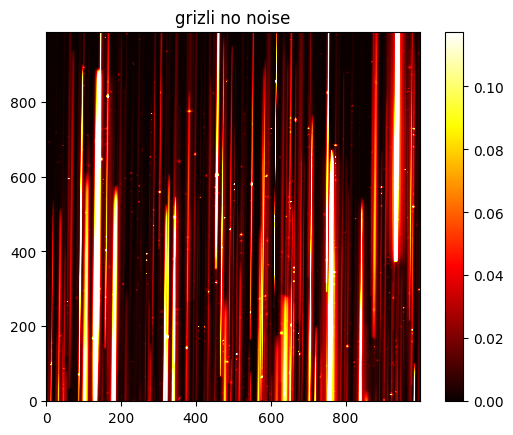

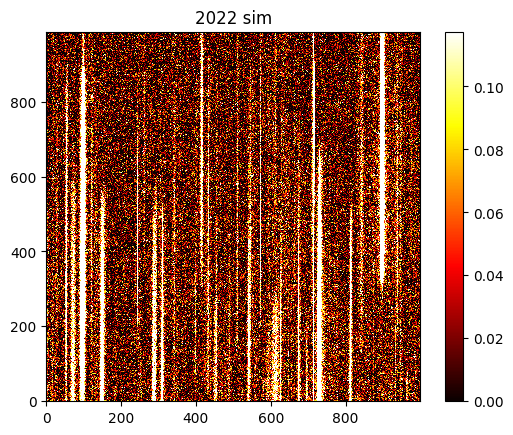

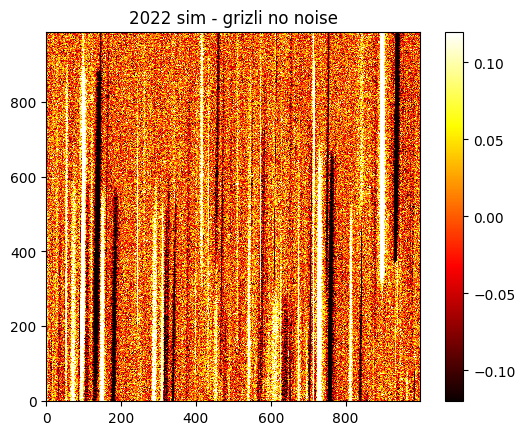

In [34]:
sz = 500
x0 = 1000
y0 = 3600
offy = 0
offx = 0
plt.imshow(grism_mod_wnoise_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmin=0,vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.show()

plt.imshow(grism_mod_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.title('grizli no noise')
plt.show()


plt.imshow(grism[y0-sz:y0+sz, x0-sz:x0+sz]-.57,vmin=0, vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.title('2022 sim')
plt.show()

plt.imshow(grism[y0-sz:y0+sz, x0-sz:x0+sz]-.57-grism_mod_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmin=-.12, vmax=0.12, cmap="hot")
plt.colorbar()
plt.title('2022 sim - grizli no noise')
plt.show()


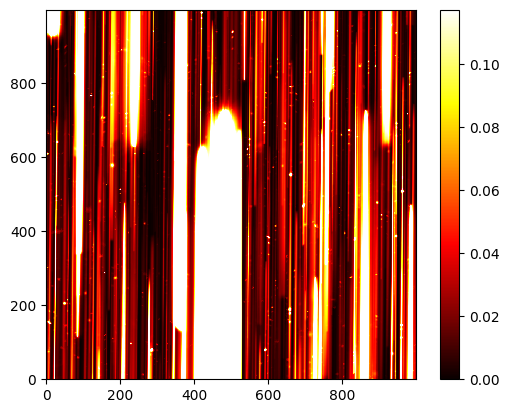

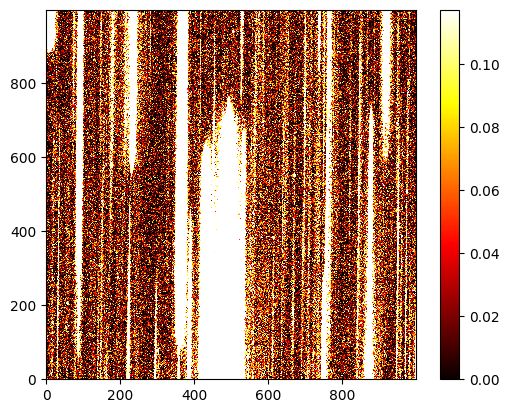

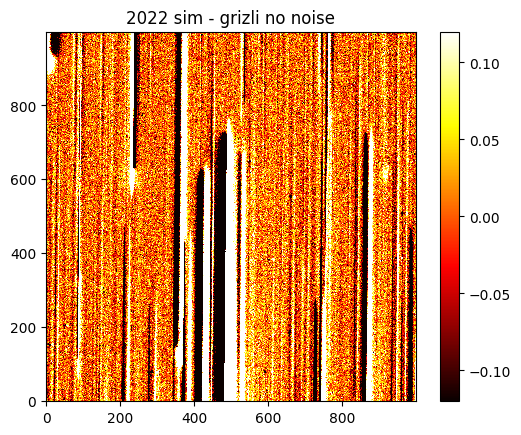

In [32]:
sz = 500
x0 = 2000
y0 = 1600
offy = 0
offx = 0
plt.imshow(grism_mod_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmin=0, vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.show()

plt.imshow(grism[y0-sz:y0+sz, x0-sz:x0+sz]-.57, vmin=0, vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.show()

plt.imshow(grism[y0-sz:y0+sz, x0-sz:x0+sz]-.57-grism_mod_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmin=-.12, vmax=0.12, cmap="hot")
plt.colorbar()
plt.title('2022 sim - grizli no noise')
plt.show()

In [303]:
sz = 500
x0 = 2000
y0 = 1600
#offy = -20
#offx = -20
background = 0.573
diffmin = 1e21
#while offx < 21 and offy < 21:
for offx in range(-20,21):
    for offy in range(-40,1):
        diffsum = np.sum((grism[y0-sz:y0+sz, x0-sz:x0+sz]-background-grism_mod_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx])**2.)
        if diffsum < diffmin:
            diffmin = diffsum
            offxmin = offx
            offymin = offy
        offy += 1
        
    #print(offx,diffsum)
    offx += 1


-11 -36


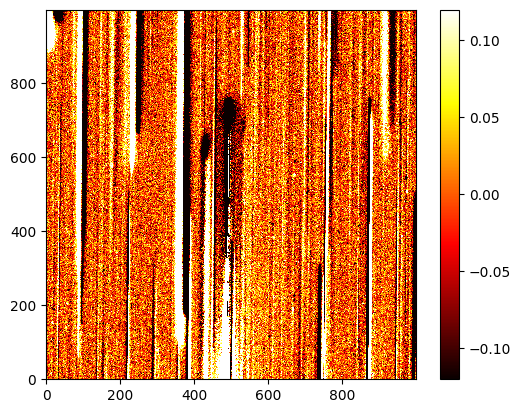

In [305]:
print(offxmin,offymin)
plt.imshow(grism[y0-sz:y0+sz, x0-sz:x0+sz]-.58-grism_mod_show[y0-sz+offymin:y0+sz+offymin , x0-sz+offxmin:x0+sz+offxmin], vmin=-.12, vmax=0.12, cmap="hot")
plt.colorbar()
plt.show()


In [ ]:
#roman.object_dispersers = collections.OrderedDict()
#roman.model *= 0

## Helper function that loops over `self.compute_model_orders` for many objects
## Result is stored in the `self.model` attribute.
#t0 = time.time()
#roman.compute_full_model(ids=found_segids, mags=found_mags,compute_size=False, size=77)

In [35]:
#plt.imshow(np.log(np.rot90(roman.model[pad:-pad, pad:-pad])))#,vmax=10)
#plt.colorbar()

In [36]:
#if not in segmap, use Keith's original prescription, except make the stars much smaller
# Define STAR shape solution
count = 0
segidmax = np.max(padded_seg)
for row in hlss_tbl[~sel_found]:
    segid = segidmax
    _is_star = row["MODIMAGE"]
    mag = row["MAG_F1500W"]
    x_0 = row["X_IMAGE"]+pad 
    y_0 = row["Y_IMAGE"]+pad 

    if _is_star:
        
        # Set radius and specific star-shape
        radius = 2 
        circ = lambda x, y: gen_circle(x, y, x_0, y_0) <= (radius ** 2) # faster to compare squares than sqrt (I think)
    
        # Define cutout bounds
        x_min = max(int(x_0 - radius + 1), 0)       # max/min ensures we stay on the detector (plus padding)
        x_max = min(int(x_0 + radius + 1), 4288)    # The +1 is so we've got a bit of padding, to ensure our cutout's not rounding down too far
        y_min = max(int(y_0 - radius + 1), 0)
        y_max = min(int(y_0 + radius + 1), 4288)
    
        # Create Meshgrid within bounds
        x = np.arange(x_min, x_max)
        y = np.arange(y_min, y_max)
        x_grid, y_grid = np.meshgrid(x, y)
    
        condition = circ(x_grid, y_grid)

    # Define GALAXY shape solution
    else:
    
        # Read extra ellipse info
        a = row["A_IMAGE"] # semi-major axis
        
        b = row["B_IMAGE"] # semi-minor axis
        if a > 10: #fix two weird super large galaxies
            a = 5
            b = 5
        if a < 2:
            fac = 2/a
            b *= fac
            a *= fac
        theta = row["THETA_IMAGE"] * (np.pi / 180) # theta in radians
        ell = (theta, a, b)
    
        # Set radius and specific ellipse shape (radius isn't the right word, but it's effectively the same)
        radius = 4
        ellipse = lambda x, y: gen_ellipse(x, y, x_0, y_0, ell) <= (radius ** 2)
    
        # Define cutout bounds
        x_min = max(int(x_0 - (radius * a) + 1), 0)     # Very similar to above cutout method; (radius * a) give the largest possible dimension
        x_max = min(int(x_0 + (radius * a) + 1), 4288)
        y_min = max(int(y_0 - (radius * a) + 1), 0)
        y_max = min(int(y_0 + (radius * a) + 1), 4288)
    
        # Create Meshgrid within bounds
        x = np.arange(x_min, x_max)
        y = np.arange(y_min, y_max)
        x_grid, y_grid = np.meshgrid(x, y)
    
        condition = ellipse(x_grid, y_grid)
    
    temp_seg = np.zeros((4288,4288), dtype="float32") # Grizli expects arrays to have dtype="float32"
    temp_seg[y_min:y_max, x_min:x_max][np.where(condition)] = segid #


    roman.seg = np.rot90(temp_seg, k=3) # temp_seg is built using non-rotated coordinates; rotate temp_seg so it lines up with our rotated direct image
    segidmax += 1

    # SIMULATION
    # ----------------------------------------------------------

    # STAR
    if _is_star:
        
        # Adjust spectrum scale using F158 Filter Bandpass object and star magnitude
        spec = star_spec.renorm(mag, "abmag", bp)
        spec.convert("flam")

    # GALAXY
    else: 

        # Read in unique Galaxy Spectrum
        sed_path = os.path.join(SED_dir, "SED:rest:gal.{0}.fits".format(row["SPECTEMP"]))
        spectrum = Table.read(sed_path, format="fits")
        wave = spectrum["wavelength"]
        flux = spectrum["flux"]
        z = row["Z"]

        spec = S.ArraySpectrum(wave=wave, flux=flux, waveunits="angstrom", fluxunits="flam").redshift(z)
        spec = spec.renorm(mag, "abmag", bp)
        spec.convert("flam")

    # By default, grizli trys to compute a cutout size. This cutout size is not large enough for the roman grism.
    # In 4) FOV0_sims/notebooks/dy-by-optimize.ipynb, I estimate the maximum needed size to be 77 for detector 1.
    # See that notebook for more details
    roman.compute_model_orders(id=segid, mag=mag, compute_size=False, size=77, in_place=True, store=False,
                               is_cgs=True, spectrum_1d=[spec.wave, spec.flux])
    count += 1
    if count%100 == 0:
        print('done with '+str(count)+' of '+str(len(hlss_tbl[~sel_found])))

done with 100 of 3048
done with 200 of 3048
done with 300 of 3048
done with 400 of 3048
done with 500 of 3048
done with 600 of 3048
done with 700 of 3048
done with 800 of 3048
done with 900 of 3048
done with 1000 of 3048
done with 1100 of 3048
done with 1200 of 3048
done with 1300 of 3048
done with 1400 of 3048
done with 1500 of 3048
done with 1600 of 3048
done with 1700 of 3048
done with 1800 of 3048
done with 1900 of 3048
done with 2000 of 3048
done with 2100 of 3048
done with 2200 of 3048
done with 2300 of 3048
done with 2400 of 3048
done with 2500 of 3048
done with 2600 of 3048
done with 2700 of 3048
done with 2800 of 3048
done with 2900 of 3048
done with 3000 of 3048


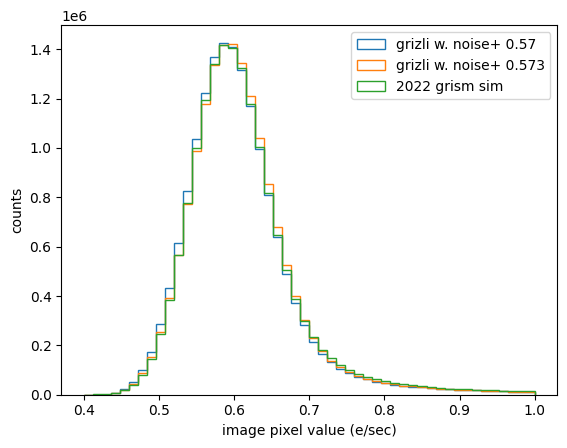

In [39]:
noise = np.random.normal(.573,.045,(4088,4088))
#noise = np.pad(noise,[100,100], mode='constant')
#plt.hist((roman.model[pad:-pad, pad:-pad]+noise).flatten(),range=(0.4,1),histtype='step',bins=50,label=r'grizli + 0.573$\pm$0.045 Gaussian')
plt.hist((roman.model[pad:-pad, pad:-pad]+roman.grism.data['SCI'][pad:-pad, pad:-pad]).flatten()+.57,range=(0.4,1),histtype='step',bins=50,label=r'grizli w. noise+ 0.57')
plt.hist((roman.model[pad:-pad, pad:-pad]+roman.grism.data['SCI'][pad:-pad, pad:-pad]).flatten()+.573,range=(0.4,1),histtype='step',bins=50,label=r'grizli w. noise+ 0.573')

#plt.hist((roman.grism.data['SCI'][pad:-pad, pad:-pad]).flatten()+.57,range=(0.4,1),histtype='step',bins=50,label=r'grizli noise only+ 0.57')

plt.hist(grism.flatten(),range=(0.4,1),histtype='step',bins=50,label='2022 grism sim')
plt.xlabel('image pixel value (e/sec)')
plt.ylabel('counts')
#plt.title('with missing sources added in')
plt.legend()
plt.show()

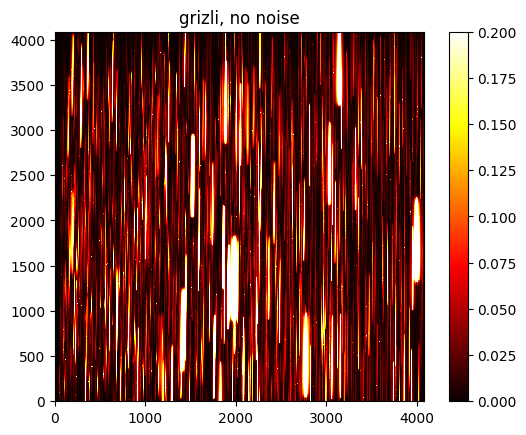

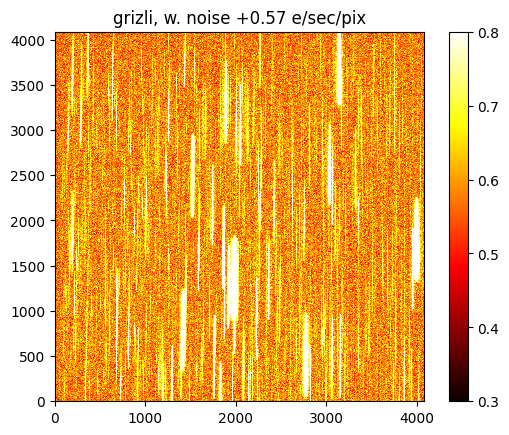

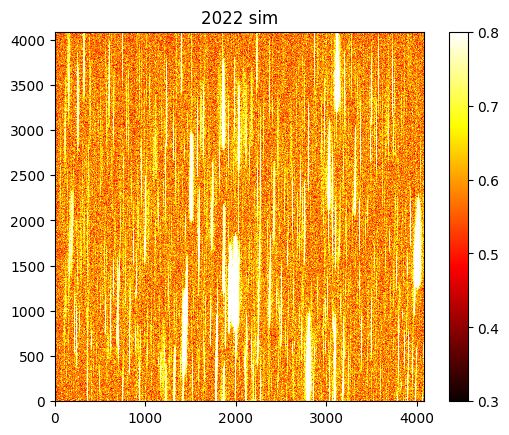

In [43]:
grism_mod_show = np.rot90(roman.model[pad:-pad, pad:-pad])
grism_mod_wnoise_show = np.rot90(roman.model[pad:-pad, pad:-pad]+roman.grism.data['SCI'][pad:-pad, pad:-pad])
plt.imshow(grism_mod_show, vmin=0, vmax=0.2, cmap="hot")
plt.colorbar()
plt.title('grizli, no noise')
plt.show()
plt.imshow(grism_mod_wnoise_show+.57, vmax=0.8, cmap="hot",vmin=.3)
plt.title('grizli, w. noise +0.57 e/sec/pix')
plt.colorbar()
plt.show()

grism = fits.open(grism_fits)[1].data
plt.imshow(grism, vmax=0.8, cmap="hot",vmin=.3)
plt.title('2022 sim')
plt.colorbar()
plt.show()

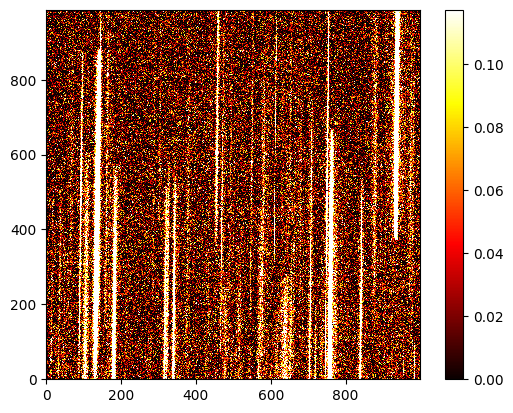

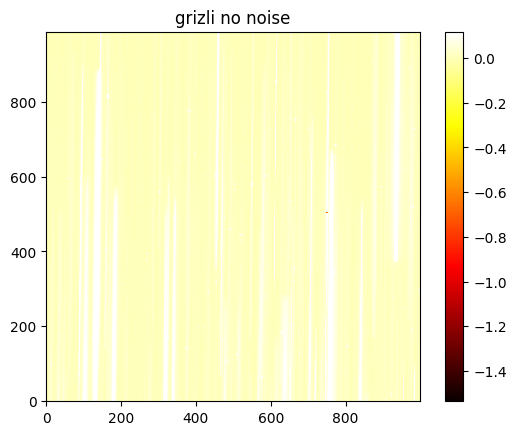

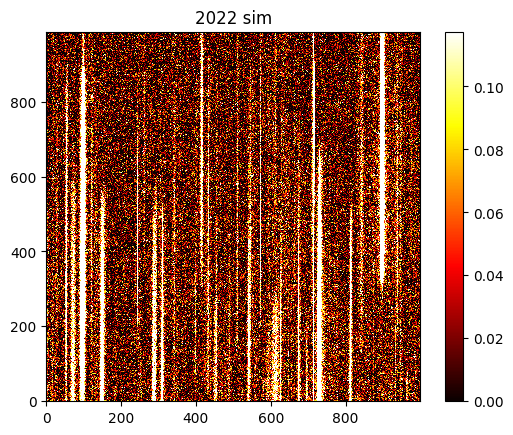

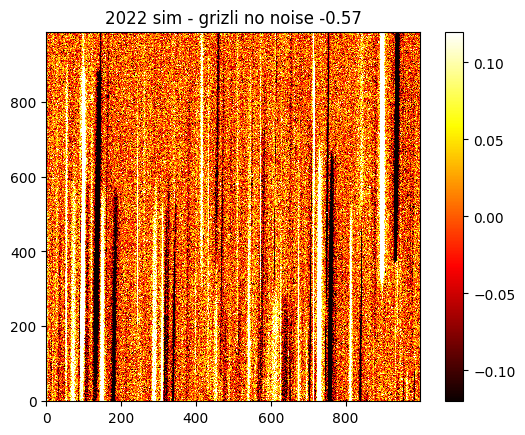

In [44]:
sz = 500
x0 = 1000
y0 = 3600
offy = 0
offx = 0
plt.imshow(grism_mod_wnoise_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmin=0,vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.show()

plt.imshow(grism_mod_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.title('grizli no noise')
plt.show()


plt.imshow(grism[y0-sz:y0+sz, x0-sz:x0+sz]-.57,vmin=0, vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.title('2022 sim')
plt.show()

plt.imshow(grism[y0-sz:y0+sz, x0-sz:x0+sz]-.57-grism_mod_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmin=-.12, vmax=0.12, cmap="hot")
plt.colorbar()
plt.title('2022 sim - grizli no noise -0.57')
plt.show()


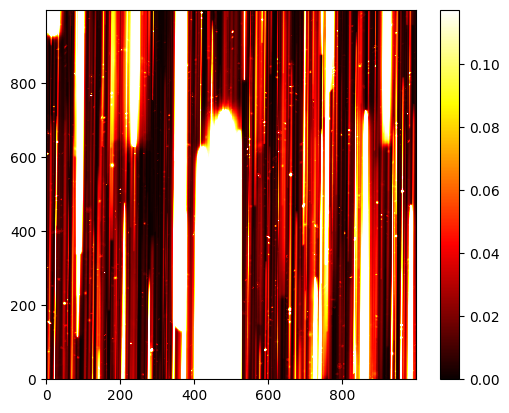

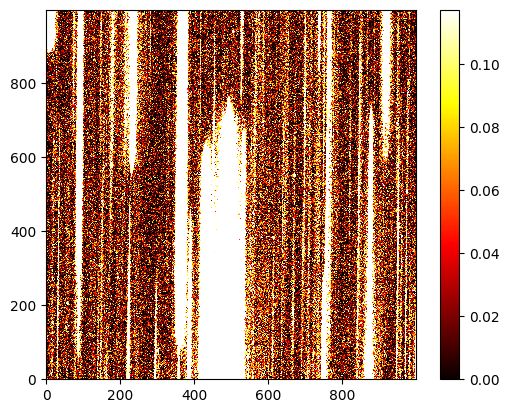

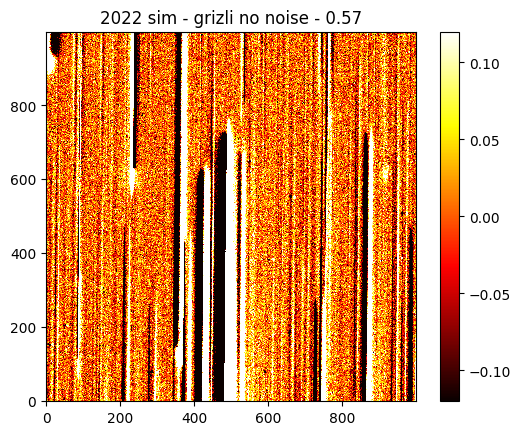

In [45]:
sz = 500
x0 = 2000
y0 = 1600
offy = 0
offx = 0
plt.imshow(grism_mod_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmin=0, vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.show()

plt.imshow(grism[y0-sz:y0+sz, x0-sz:x0+sz]-.57, vmin=0, vmax=0.11738539732765789, cmap="hot")
plt.colorbar()
plt.show()

plt.imshow(grism[y0-sz:y0+sz, x0-sz:x0+sz]-.57-grism_mod_show[y0-sz+offy:y0+sz+offy , x0-sz+offx:x0+sz+offx], vmin=-.12, vmax=0.12, cmap="hot")
plt.colorbar()
plt.title('2022 sim - grizli no noise - 0.57')
plt.show()

In [264]:
print(segment_map)

<photutils.segmentation.core.SegmentationImage>
shape: (4088, 4088)
nlabels: 8133
labels: [   1    2    3    4    5 ... 8129 8130 8131 8132 8133]


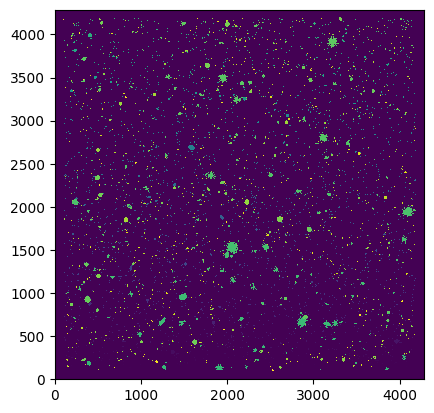

In [57]:
#plt.imshow(roman.seg)
plt.imshow(padded_seg)

In [266]:
from photutils.segmentation import deblend_sources
segm_deblend = deblend_sources(full_image_bkgsub, segment_map,
                               npixels=10, nlevels=32, contrast=0.001,
                               progress_bar=False)

In [267]:
print(segm_deblend)

<photutils.segmentation.core.SegmentationImage>
shape: (4088, 4088)
nlabels: 8787
labels: [   1    2    3    4    5 ... 8783 8784 8785 8786 8787]


In [268]:
len(hlss_tbl)

10763

In [279]:
np.unique(segm_deblend.data)

array([   0,    1,    2, ..., 8785, 8786, 8787])

In [292]:
segmap_db_val = segm_deblend.data
missed_ids = []
for object in tqdm(hlss_tbl):

    id = object["NUMBER"]
    mag = object["MAG_F1500W"]
    #if mag < 18:
    _is_star = object["MODIMAGE"]
    x_0 = object["X_IMAGE"] #+ 100 # Add 100 to account for padding
    y_0 = object["Y_IMAGE"] #+ 100 
    segid = segmap_db_val[int(y_0)][int(x_0)]
    if segid != 0:
        sel = segmap_db_val == segid
        temp_seg = np.copy(segmap_db_val)
        temp_seg[~sel] = 0
        temp_seg[sel] = id
        temp_seg = np.pad(temp_seg, [100, 100], mode='constant')
        roman.seg = temp_seg.astype("float32")
    else:
        #if not in segmap, use Keith's original prescription, except make the stars much smaller
        # Define STAR shape solution
        if _is_star:
            
            # Set radius and specific star-shape
            radius = 40 
            circ = lambda x, y: gen_circle(x, y, x_0, y_0) <= (radius ** 2) # faster to compare squares than sqrt (I think)
    
            # Define cutout bounds
            x_min = max(int(x_0 - radius + 1), 0)       # max/min ensures we stay on the detector (plus padding)
            x_max = min(int(x_0 + radius + 1), 4288)    # The +1 is so we've got a bit of padding, to ensure our cutout's not rounding down too far
            y_min = max(int(y_0 - radius + 1), 0)
            y_max = min(int(y_0 + radius + 1), 4288)
    
            # Create Meshgrid within bounds
            x = np.arange(x_min, x_max)
            y = np.arange(y_min, y_max)
            x_grid, y_grid = np.meshgrid(x, y)
    
            condition = circ(x_grid, y_grid)
        
        # Define GALAXY shape solution
        else:
    
            # Read extra ellipse info
            a = object["A_IMAGE"] # semi-major axis
            b = object["B_IMAGE"] # semi-minor axis
            theta = object["THETA_IMAGE"] * (np.pi / 180) # theta in radians
            ell = (theta, a, b)
    
            # Set radius and specific ellipse shape (radius isn't the right word, but it's effectively the same)
            radius = 4
            ellipse = lambda x, y: gen_ellipse(x, y, x_0, y_0, ell) <= (radius ** 2)
    
            # Define cutout bounds
            x_min = max(int(x_0 - (radius * a) + 1), 0)     # Very similar to above cutout method; (radius * a) give the largest possible dimension
            x_max = min(int(x_0 + (radius * a) + 1), 4288)
            y_min = max(int(y_0 - (radius * a) + 1), 0)
            y_max = min(int(y_0 + (radius * a) + 1), 4288)
    
            # Create Meshgrid within bounds
            x = np.arange(x_min, x_max)
            y = np.arange(y_min, y_max)
            x_grid, y_grid = np.meshgrid(x, y)
    
            condition = ellipse(x_grid, y_grid)
        temp_seg = np.zeros((4288,4288), dtype="float32") # Grizli expects arrays to have dtype="float32"
        temp_seg[y_min:y_max, x_min:x_max][np.where(condition)] = id #
        
        # SIMULATION
        # ----------------------------------------------------------
    
        # STAR
        if _is_star:
            
            # Adjust spectrum scale using F158 Filter Bandpass object and star magnitude
            spec = star_spec.renorm(mag, "abmag", bp)
            spec.convert("flam")
    
        # GALAXY
        else: 
    
            # Read in unique Galaxy Spectrum
            sed_path = os.path.join(SED_dir, "SED:rest:gal.{0}.fits".format(object["SPECTEMP"]))
            spectrum = Table.read(sed_path, format="fits")
            wave = spectrum["wavelength"]
            flux = spectrum["flux"]
            z = object["Z"]
    
            spec = S.ArraySpectrum(wave=wave, flux=flux, waveunits="angstrom", fluxunits="flam").redshift(z)
            spec = spec.renorm(mag, "abmag", bp)
            spec.convert("flam")
    
        # By default, grizli trys to compute a cutout size. This cutout size is not large enough for the roman grism.
        # In 4) FOV0_sims/notebooks/dy-by-optimize.ipynb, I estimate the maximum needed size to be 77 for detector 1.
        # See that notebook for more details
        roman.compute_model_orders(id=id, mag=mag, compute_size=False, size=77, in_place=True, store=False,
                                   is_cgs=True, spectrum_1d=[spec.wave, spec.flux])    
    else:
        missed_ids.append(id)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10763/10763 [10:56<00:00, 16.39it/s]


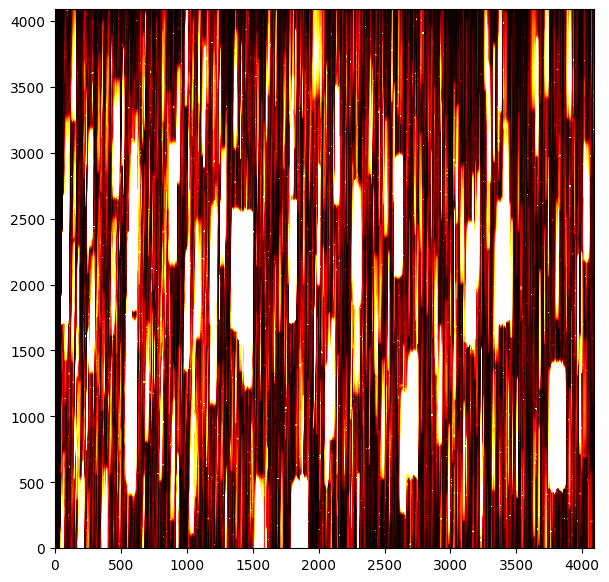

In [295]:
plt.imshow(np.rot90(roman.model[pad:-pad, pad:-pad]), vmin=0, vmax=0.11738539732765789, cmap="hot")

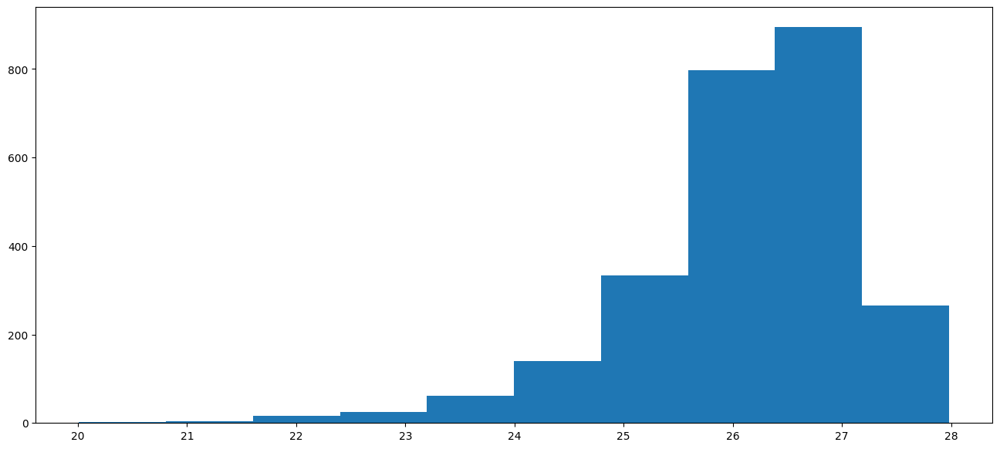

In [293]:
sel_missed = np.isin(hlss_tbl['NUMBER'],missed_ids)
plt.hist(hlss_tbl[sel_missed]["MAG_F1500W"])
plt.show()

In [ ]:
# If an object is too small and doesn't have an integer solution to it's equation, it'll print an error.
# Sometimes, I catch those errors in the segmentation map making phase and write them to a seperate file.

error_file = open("errors.txt", "w")

for object in tqdm(hlss_tbl):

    id = object["NUMBER"]
    mag = object["MAG_F1500W"]
    _is_star = object["MODIMAGE"]
    x_0 = object["X_IMAGE"] + 100 # Add 100 to account for padding
    y_0 = object["Y_IMAGE"] + 100 

    # SEGMENTATION MAPMAKING
    # ----------------------------------------------------------

    # Define STAR shape solution
    if _is_star:
        
        # Set radius and specific star-shape
        radius = 40 
        circ = lambda x, y: gen_circle(x, y, x_0, y_0) <= (radius ** 2) # faster to compare squares than sqrt (I think)

        # Define cutout bounds
        x_min = max(int(x_0 - radius + 1), 0)       # max/min ensures we stay on the detector (plus padding)
        x_max = min(int(x_0 + radius + 1), 4288)    # The +1 is so we've got a bit of padding, to ensure our cutout's not rounding down too far
        y_min = max(int(y_0 - radius + 1), 0)
        y_max = min(int(y_0 + radius + 1), 4288)

        # Create Meshgrid within bounds
        x = np.arange(x_min, x_max)
        y = np.arange(y_min, y_max)
        x_grid, y_grid = np.meshgrid(x, y)

        condition = circ(x_grid, y_grid)
    
    # Define GALAXY shape solution
    else:

        # Read extra ellipse info
        a = object["A_IMAGE"] # semi-major axis
        b = object["B_IMAGE"] # semi-minor axis
        theta = object["THETA_IMAGE"] * (np.pi / 180) # theta in radians
        ell = (theta, a, b)

        # Set radius and specific ellipse shape (radius isn't the right word, but it's effectively the same)
        radius = 4
        ellipse = lambda x, y: gen_ellipse(x, y, x_0, y_0, ell) <= (radius ** 2)

        # Define cutout bounds
        x_min = max(int(x_0 - (radius * a) + 1), 0)     # Very similar to above cutout method; (radius * a) give the largest possible dimension
        x_max = min(int(x_0 + (radius * a) + 1), 4288)
        y_min = max(int(y_0 - (radius * a) + 1), 0)
        y_max = min(int(y_0 + (radius * a) + 1), 4288)

        # Create Meshgrid within bounds
        x = np.arange(x_min, x_max)
        y = np.arange(y_min, y_max)
        x_grid, y_grid = np.meshgrid(x, y)

        condition = ellipse(x_grid, y_grid)

    temp_seg = np.zeros((4288,4288), dtype="float32") # Grizli expects arrays to have dtype="float32"
    temp_seg[y_min:y_max, x_min:x_max][np.where(condition)] = id #

    # Uncomment this is writing not-in-seg-map errors to a seperate file
    if not np.any(temp_seg):
        error_file.write("ID {0} not in temp_seg \n".format(id))
        continue

    roman.seg = np.rot90(temp_seg, k=3) # temp_seg is built using non-rotated coordinates; rotate temp_seg so it lines up with our rotated direct image

    # SIMULATION
    # ----------------------------------------------------------

    # STAR
    if _is_star:
        
        # Adjust spectrum scale using F158 Filter Bandpass object and star magnitude
        spec = star_spec.renorm(mag, "abmag", bp)
        spec.convert("flam")

    # GALAXY
    else: 

        # Read in unique Galaxy Spectrum
        sed_path = os.path.join(SED_dir, "SED:rest:gal.{0}.fits".format(object["SPECTEMP"]))
        spectrum = Table.read(sed_path, format="fits")
        wave = spectrum["wavelength"]
        flux = spectrum["flux"]
        z = object["Z"]

        spec = S.ArraySpectrum(wave=wave, flux=flux, waveunits="angstrom", fluxunits="flam").redshift(z)
        spec = spec.renorm(mag, "abmag", bp)
        spec.convert("flam")

    # By default, grizli trys to compute a cutout size. This cutout size is not large enough for the roman grism.
    # In 4) FOV0_sims/notebooks/dy-by-optimize.ipynb, I estimate the maximum needed size to be 77 for detector 1.
    # See that notebook for more details
    roman.compute_model_orders(id=id, mag=mag, compute_size=False, size=77, in_place=True, store=False,
                               is_cgs=True, spectrum_1d=[spec.wave, spec.flux])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10763/10763 [12:04<00:00, 14.85it/s]


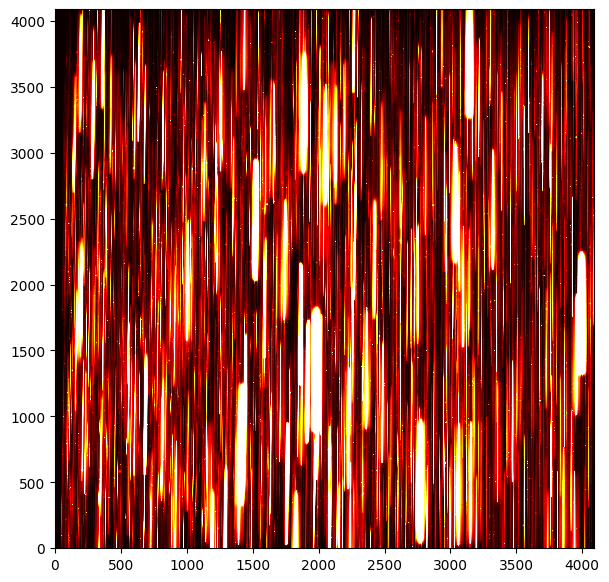

In [21]:
# Dispersed model is still rotated; We have to rotate it back
upright_img = np.rot90(roman.model[pad:-pad, pad:-pad])

plt.imshow(upright_img, vmin=0, vmax=0.11738539732765789, cmap="hot") # this vmax works well on the grism sim products

In [46]:
sel = hlss_tbl["A_IMAGE"] > 10
print(hlss_tbl[sel])

NUMBER  X_IMAGE   Y_IMAGE  A_IMAGE  B_IMAGE  THETA_IMAGE MAG_F1500W SPECTEMP    Z     MODIMAGE MODIMAGE_1 MODIMAGE_2
------ --------- --------- -------- -------- ----------- ---------- -------- -------- -------- ---------- ----------
 15568 1050.8793 3194.3374 170.4919  58.3552      198.35      26.01    15568  1.64666        0  9.4886394 -0.7007214
164157 2288.4668  220.5543  10.1937   8.3978      346.91       25.3   164157 2.513814        0  9.4511306 -0.7930893
184716   93.3349  762.7299  12.9693   4.1035       86.42      24.83   184716 2.427998        0  9.5182463 -0.7764258
101083  442.3269 4026.6964  10.0005   8.0783      124.56      24.79   101083  0.08076        0  9.5071062  -0.675079
 96918 3927.9497  458.0949  11.7446   9.3829      262.35      24.51    96918  0.05113        0  9.4009808 -0.7855772
118953   3587.01 3238.1773  11.0858   9.0846       14.25      23.69   118953 1.832217        0  9.4113238 -0.6991991
 30267 2573.9223  831.3842 220.9088 117.9295      240.01      23

In [37]:
# If an object is too small and doesn't have an integer solution to it's equation, it'll print an error.
# Sometimes, I catch those errors in the segmentation map making phase and write them to a seperate file.
roman_new = GrismFLT(direct_file=ready_fits, seg_file=empty_seg, pad=pad)
error_file = open("errors_new.txt", "w")
temp_seg = np.zeros((4288,4288), dtype="float32") # Grizli expects arrays to have dtype="float32"
for object in tqdm(hlss_tbl):

    id = object["NUMBER"]
    mag = object["MAG_F1500W"]
    _is_star = object["MODIMAGE"]
    x_0 = object["X_IMAGE"] + 100 # Add 100 to account for padding
    y_0 = object["Y_IMAGE"] + 100 

    # SEGMENTATION MAPMAKING
    # ----------------------------------------------------------

    # Define STAR shape solution
    if _is_star:
        
        # Set radius and specific star-shape
        radius = 40*(14/mag)**4.
        if radius < 4:
            radius = 4
        circ = lambda x, y: gen_circle(x, y, x_0, y_0) <= (radius ** 2) # faster to compare squares than sqrt (I think)

        # Define cutout bounds
        x_min = max(int(x_0 - radius + 1), 0)       # max/min ensures we stay on the detector (plus padding)
        x_max = min(int(x_0 + radius + 1), 4288)    # The +1 is so we've got a bit of padding, to ensure our cutout's not rounding down too far
        y_min = max(int(y_0 - radius + 1), 0)
        y_max = min(int(y_0 + radius + 1), 4288)

        # Create Meshgrid within bounds
        x = np.arange(x_min, x_max)
        y = np.arange(y_min, y_max)
        x_grid, y_grid = np.meshgrid(x, y)

        condition = circ(x_grid, y_grid)
    
    # Define GALAXY shape solution
    else:

        # Read extra ellipse info
        a = object["A_IMAGE"] # semi-major axis
        b = object["B_IMAGE"] # semi-minor axis
        theta = object["THETA_IMAGE"] * (np.pi / 180) # theta in radians
        ell = (theta, a, b)

        # Set radius and specific ellipse shape (radius isn't the right word, but it's effectively the same)
        radius = 4
        ellipse = lambda x, y: gen_ellipse(x, y, x_0, y_0, ell) <= (radius ** 2)

        # Define cutout bounds
        x_min = max(int(x_0 - (radius * a) + 1), 0)     # Very similar to above cutout method; (radius * a) give the largest possible dimension
        x_max = min(int(x_0 + (radius * a) + 1), 4288)
        y_min = max(int(y_0 - (radius * a) + 1), 0)
        y_max = min(int(y_0 + (radius * a) + 1), 4288)

        # Create Meshgrid within bounds
        x = np.arange(x_min, x_max)
        y = np.arange(y_min, y_max)
        x_grid, y_grid = np.meshgrid(x, y)

        condition = ellipse(x_grid, y_grid)

    
    temp_seg[y_min:y_max, x_min:x_max][np.where(condition)] = id #

    # Uncomment this is writing not-in-seg-map errors to a seperate file
    if not np.any(temp_seg):
        error_file.write("ID {0} not in temp_seg \n".format(id))
        continue

roman_new.seg = np.rot90(temp_seg, k=3) # temp_seg is built using non-rotated coordinates; rotate temp_seg so it lines up with our rotated direct image

Image cutout: x=slice(0, 4088, None), y=slice(0, 4088, None) [Out of range]
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / Pad ref HDU with 264 pixels
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / blot segmentation /Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/empty_seg.fits[0]
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10763/10763 [01:01<00:00, 176.25it/s]


In [47]:
# If an object is too small and doesn't have an integer solution to it's equation, it'll print an error.
# Sometimes, I catch those errors in the segmentation map making phase and write them to a seperate file.
roman_new = GrismFLT(direct_file=ready_fits, seg_file=empty_seg, pad=pad)
error_file = open("errors_new.txt", "w")
temp_seg = np.zeros((4288,4288), dtype="float32") # Grizli expects arrays to have dtype="float32"
for object in tqdm(hlss_tbl):

    id = object["NUMBER"]
    mag = object["MAG_F1500W"]
    _is_star = object["MODIMAGE"]
    x_0 = object["X_IMAGE"] + 100 # Add 100 to account for padding
    y_0 = object["Y_IMAGE"] + 100 
    temp_seg[int(y_0), int(x_0)] = id

roman_new.seg = np.rot90(temp_seg, k=3) # temp_seg is built using non-rotated coordinates; rotate temp_seg so it lines up with our rotated direct image

Image cutout: x=slice(0, 4088, None), y=slice(0, 4088, None) [Out of range]
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / Pad ref HDU with 264 pixels
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / blot segmentation /Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/empty_seg.fits[0]
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10763/10763 [00:00<00:00, 401377.19it/s]


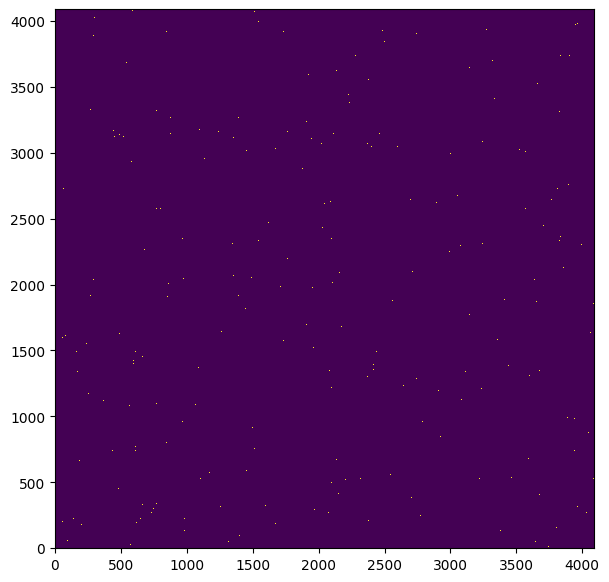

In [48]:
plt.imshow(np.rot90(roman_new.seg[pad:-pad, pad:-pad]),vmax=1)

In [49]:
sel = roman_new.seg > 0
np.sum(sel),len(hlss_tbl)

(10759, 10763)

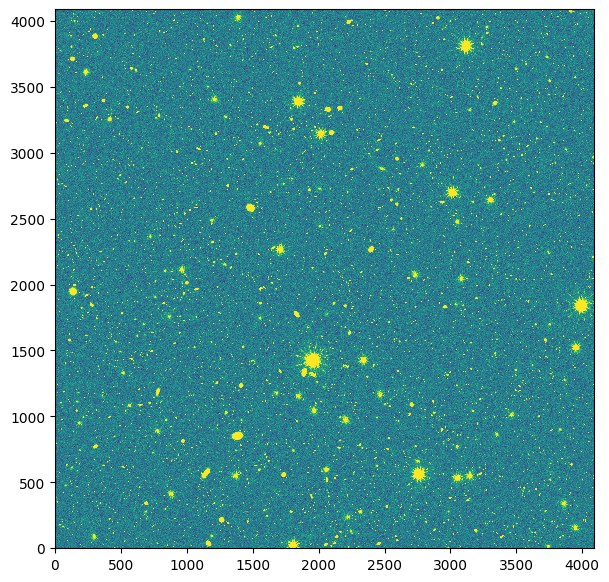

In [ ]:
file = fits.open(direct_fits)
plt.imshow(file[1].data,vmax=.5)

In [50]:
no_id = []
for object in tqdm(hlss_tbl):

    id = object["NUMBER"]
    mag = object["MAG_F1500W"]
    _is_star = object["MODIMAGE"]
    # SIMULATION
    # ----------------------------------------------------------

    # STAR
    if _is_star:
        
        # Adjust spectrum scale using F158 Filter Bandpass object and star magnitude
        spec = star_spec.renorm(mag, "abmag", bp)
        spec.convert("flam")

    # GALAXY
    else: 

        # Read in unique Galaxy Spectrum
        sed_path = os.path.join(SED_dir, "SED:rest:gal.{0}.fits".format(object["SPECTEMP"]))
        spectrum = Table.read(sed_path, format="fits")
        wave = spectrum["wavelength"]
        flux = spectrum["flux"]
        z = object["Z"]

        spec = S.ArraySpectrum(wave=wave, flux=flux, waveunits="angstrom", fluxunits="flam").redshift(z)
        spec = spec.renorm(mag, "abmag", bp)
        spec.convert("flam")

    # By default, grizli trys to compute a cutout size. This cutout size is not large enough for the roman grism.
    # In 4) FOV0_sims/notebooks/dy-by-optimize.ipynb, I estimate the maximum needed size to be 77 for detector 1.
    # See that notebook for more details
    if id in roman.seg:
        roman_new.compute_model_orders(id=id, mag=mag, compute_size=False, size=77, in_place=True, store=False,
                               is_cgs=True, spectrum_1d=[spec.wave, spec.flux])
    else:
        no_id.append(id)

 18%|█████████████████████████████▏                                                                                                                                | 1989/10763 [02:14<09:05, 16.10it/s]

ID 145031 not found in segmentation image


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10763/10763 [12:42<00:00, 14.12it/s]


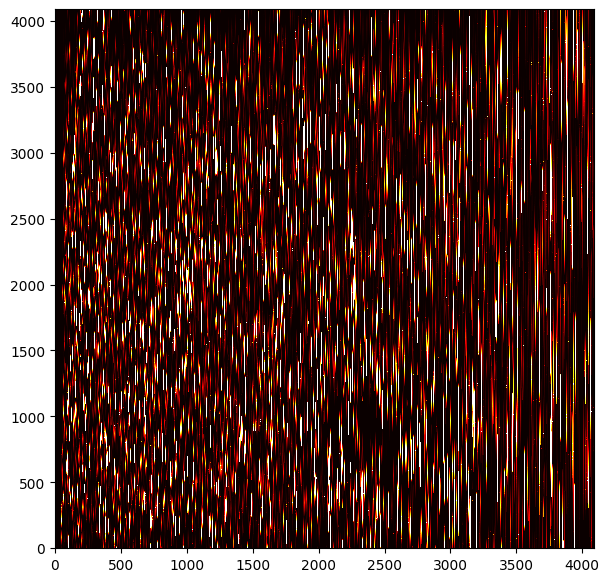

In [51]:
# Dispersed model is still rotated; We have to rotate it back
upright_img_new = np.rot90(roman_new.model[pad:-pad, pad:-pad])

plt.imshow(upright_img_new, vmin=0, vmax=0.11738539732765789, cmap="hot") # this vmax works well on the grism sim products

  0%|                                                                                                                                                                         | 0/10763 [00:00<?, ?it/s]

Image cutout: x=slice(0, 4088, None), y=slice(0, 4088, None) [Out of range]
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / Pad ref HDU with 264 pixels
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / blot segmentation /Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/empty_seg.fits[0]
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Image cutout: x=slice(0, 4088, None), y=slice(0, 4088, None) [Out of range]
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / Pad ref HDU with 264 pixels
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / blot segmentation /Users/ross.1333/Dropbox/Ro

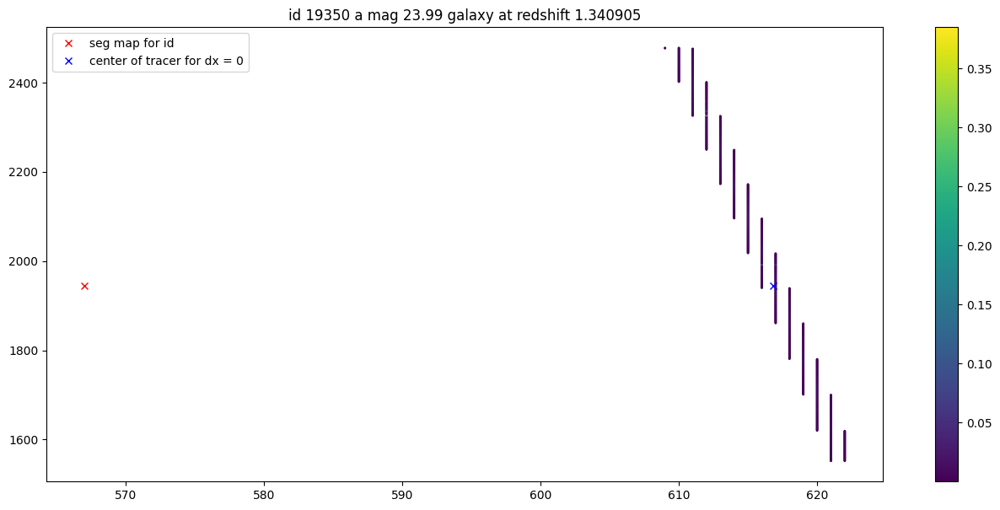

number of non-zero pixel using empty direct is 1854


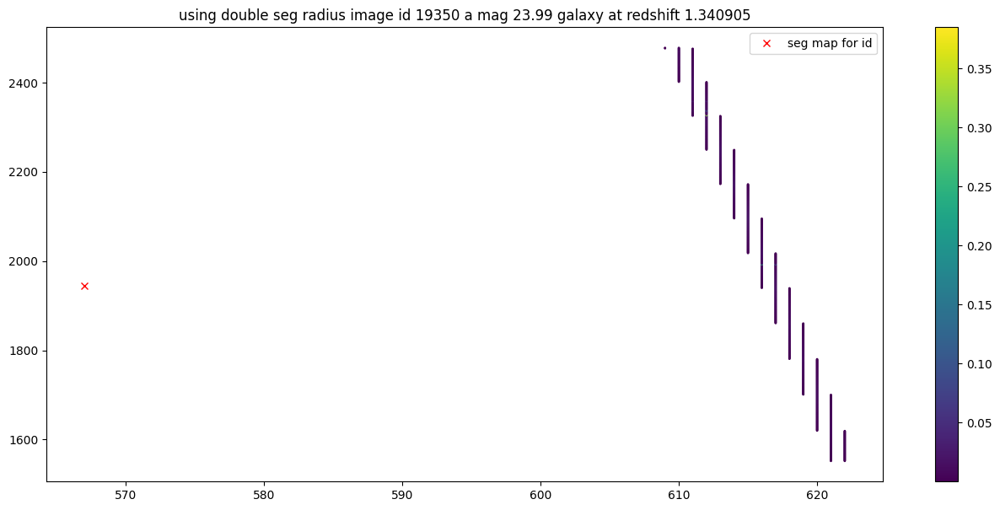

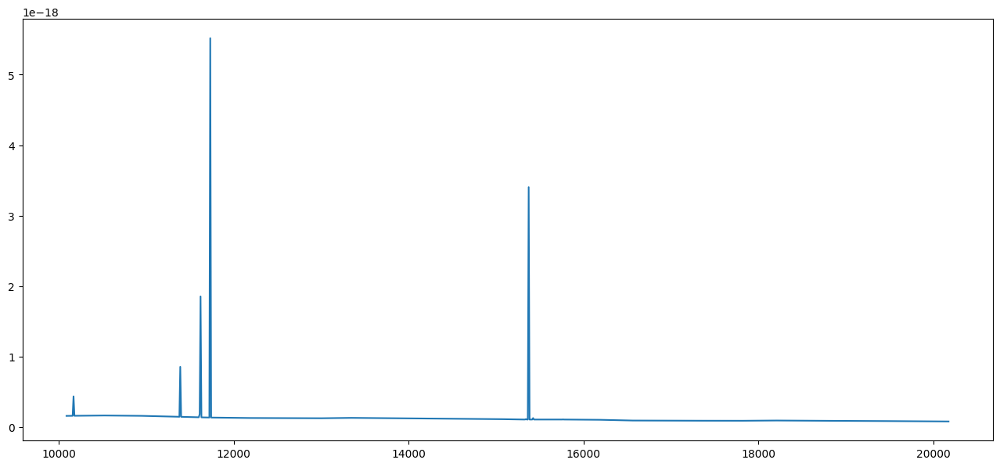

 61%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 6573/10763 [00:05<00:03, 1253.96it/s]

Image cutout: x=slice(0, 4088, None), y=slice(0, 4088, None) [Out of range]
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / Pad ref HDU with 264 pixels
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / blot segmentation /Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/empty_seg.fits[0]
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Image cutout: x=slice(0, 4088, None), y=slice(0, 4088, None) [Out of range]
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / Pad ref HDU with 264 pixels
/Users/ross.1333/Dropbox/RomanGRS/products/FOV0/roll_0/dither_0x_0y/SCA1/ready_direct_GRS_FOV0_roll0_dx0_dy0_SCA1_direct_final.fits / blot segmentation /Users/ross.1333/Dropbox/Ro

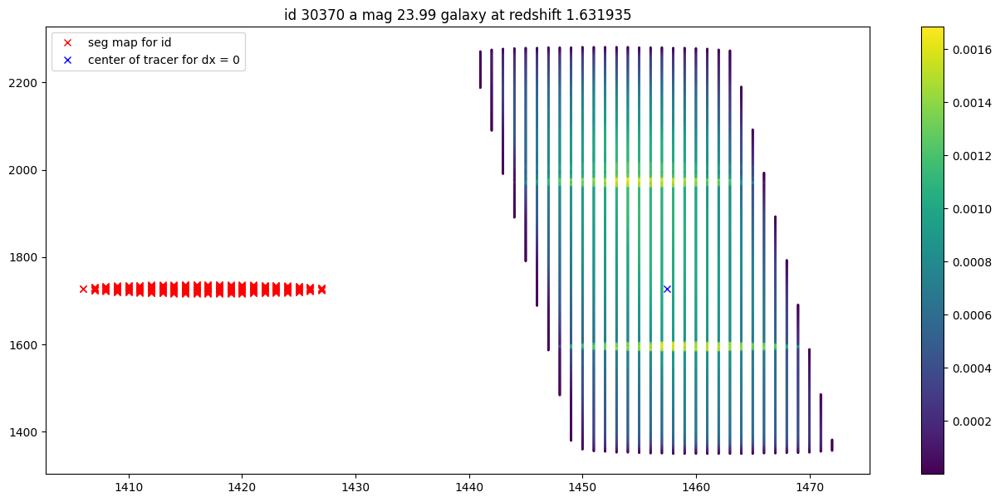

number of non-zero pixel using empty direct is 41658


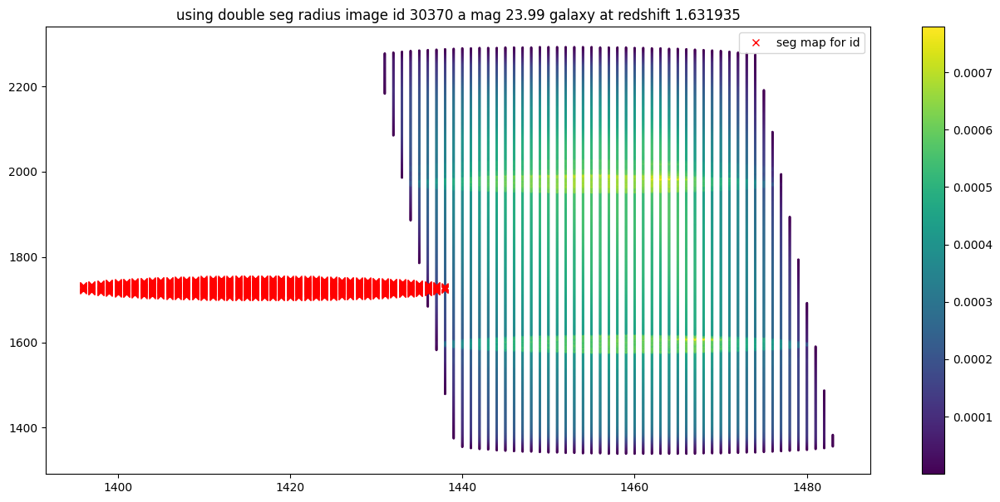

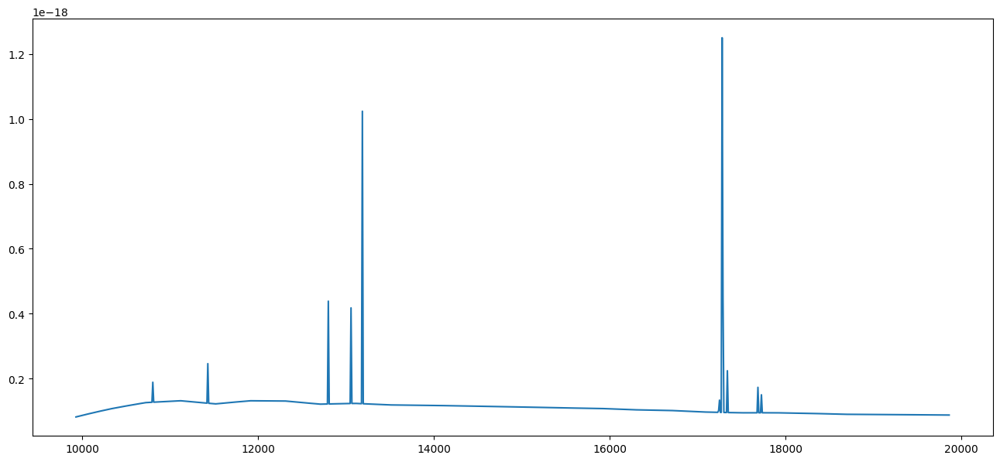

 61%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 6574/10763 [00:09<00:06, 695.70it/s]


In [250]:
#go through a few ids and compare grism to direct in area around source
Nshow = 2
N = 0
file = fits.open(direct_fits)
for object in tqdm(hlss_tbl):
    if object["MODIMAGE"] == 0 and object["MAG_F1500W"] > 23 and object["MAG_F1500W"] < 24 and object['Z'] > 1 and object['Z'] < 2:
        roman_temp = GrismFLT(direct_file=ready_fits, seg_file=empty_seg, pad=pad)
        roman_temp2 = GrismFLT(direct_file=ready_fits, seg_file=empty_seg, pad=pad)
        temp_seg = np.zeros((4288,4288), dtype="float32") # Grizli expects arrays to have dtype="float32"
        temp_seg2 = np.zeros((4288,4288), dtype="float32") # Grizli expects arrays to have dtype="float32"
    
        id = object["NUMBER"]
        mag = object["MAG_F1500W"]
        _is_star = object["MODIMAGE"]
        x_0 = object["X_IMAGE"] + 100 # Add 100 to account for padding
        y_0 = object["Y_IMAGE"] + 100 
    
        # SEGMENTATION MAPMAKING
        # ----------------------------------------------------------
    
        # Define STAR shape solution
        if _is_star:
            
            # Set radius and specific star-shape
            radius = 40*(14/mag)**4.
            if radius < 4:
                radius = 4
            circ = lambda x, y: gen_circle(x, y, x_0, y_0) <= (radius ** 2) # faster to compare squares than sqrt (I think)
    
            # Define cutout bounds
            x_min = max(int(x_0 - radius + 1), 0)       # max/min ensures we stay on the detector (plus padding)
            x_max = min(int(x_0 + radius + 1), 4288)    # The +1 is so we've got a bit of padding, to ensure our cutout's not rounding down too far
            y_min = max(int(y_0 - radius + 1), 0)
            y_max = min(int(y_0 + radius + 1), 4288)
    
            # Create Meshgrid within bounds
            x = np.arange(x_min, x_max)
            y = np.arange(y_min, y_max)
            x_grid, y_grid = np.meshgrid(x, y)
    
            condition = circ(x_grid, y_grid)
    
        # Define GALAXY shape solution
        else:
            # Read extra ellipse info
            a = object["A_IMAGE"] # semi-major axis
            b = object["B_IMAGE"] # semi-minor axis
            theta = object["THETA_IMAGE"] * (np.pi / 180) # theta in radians
            ell = (theta, a, b)
            ell2 = (theta, a*2, b*2)
    
            # Set radius and specific ellipse shape (radius isn't the right word, but it's effectively the same)
            radius = 4
            ellipse = lambda x, y: gen_ellipse(x, y, x_0, y_0, ell) <= (radius ** 2)
            ellipse2 = lambda x, y: gen_ellipse(x, y, x_0, y_0, ell2) <= (radius ** 2)
            # Define cutout bounds
            x_min = max(int(x_0 - (radius * a) + 1), 0)     # Very similar to above cutout method; (radius * a) give the largest possible dimension
            x_max = min(int(x_0 + (radius * a) + 1), 4288)
            y_min = max(int(y_0 - (radius * a) + 1), 0)
            y_max = min(int(y_0 + (radius * a) + 1), 4288)
    
            # Create Meshgrid within bounds
            x = np.arange(x_min, x_max)
            y = np.arange(y_min, y_max)
            x_grid, y_grid = np.meshgrid(x, y)
    
            condition = ellipse(x_grid, y_grid)
    
            # Define cutout bounds x2
            x_min2 = max(int(x_0 - (radius * a*2) + 1), 0)     # Very similar to above cutout method; (radius * a) give the largest possible dimension
            x_max2 = min(int(x_0 + (radius * a*2) + 1), 4288)
            y_min2 = max(int(y_0 - (radius * a*2) + 1), 0)
            y_max2 = min(int(y_0 + (radius * a*2) + 1), 4288)
    
            # Create Meshgrid within bounds
            x = np.arange(x_min2, x_max2)
            y = np.arange(y_min2, y_max2)
            x_grid, y_grid = np.meshgrid(x, y)
    
            condition2 = ellipse2(x_grid, y_grid)
        
        
        
        temp_seg[y_min:y_max, x_min:x_max][np.where(condition)] = id #
        temp_seg2[y_min2:y_max2, x_min2:x_max2][np.where(condition2)] = id
        print(np.sum(condition),np.sum(condition2))
    
        #temp_seg[int(y_0)][ int(x_0)] = id
    
        roman_temp.seg = temp_seg#np.rot90(temp_seg, k=3) # temp_seg is built using non-rotated coordinates; rotate temp_seg so it lines up with our rotated direct image
        roman_temp2.seg = temp_seg2
        # SIMULATION
        # ----------------------------------------------------------
    
        # STAR
        if _is_star:
            
            # Adjust spectrum scale using F158 Filter Bandpass object and star magnitude
            spec = star_spec.renorm(mag, "abmag", bp)
            spec.convert("flam")
            tp = 'star'
    
        # GALAXY
        else: 
    
            # Read in unique Galaxy Spectrum
            sed_path = os.path.join(SED_dir, "SED:rest:gal.{0}.fits".format(object["SPECTEMP"]))
            spectrum = Table.read(sed_path, format="fits")
            wave = spectrum["wavelength"]
            flux = spectrum["flux"]
            z = object["Z"]
    
            spec = S.ArraySpectrum(wave=wave, flux=flux, waveunits="angstrom", fluxunits="flam").redshift(z)
            spec = spec.renorm(mag, "abmag", bp)
            spec.convert("flam")
            tp = 'galaxy'
    
        # By default, grizli trys to compute a cutout size. This cutout size is not large enough for the roman grism.
        # In 4) FOV0_sims/notebooks/dy-by-optimize.ipynb, Keith estimates the maximum needed size to be 77 for detector 1.
        # See that notebook for more details
        roman_temp.compute_model_orders(id=id, mag=mag, compute_size=False, size=77, in_place=True, store=False,
                           is_cgs=True, spectrum_1d=[spec.wave, spec.flux])
        roman_temp2.compute_model_orders(id=id, mag=mag, compute_size=False, size=77, in_place=True, store=False,
                           is_cgs=True, spectrum_1d=[spec.wave, spec.flux])
        
        print(id)
        #plt.imshow(upright_img_temp[int(xmin):int(xmax), int(ymin):int(ymax)], vmin=0, vmax=0.00011738539732765789, cmap="hot") # this vmax works well on the grism sim products
        #plt.plot(upright_img_temp.nonzero()[0],upright_img_temp.nonzero()[1],'k,')
        sel = roman_temp.model > 0
        #plt.plot(roman_temp.model.nonzero()[0],roman_temp.model.nonzero()[1],'k,')
        plt.scatter(roman_temp.model.nonzero()[0],roman_temp.model.nonzero()[1],c=roman_temp.model[sel],s=1)
        plt.colorbar()
        plt.plot(roman_temp.seg.nonzero()[0],roman_temp.seg.nonzero()[1],'rx',label='seg map for id')
        dx = (0,0)
        dy, lam = roman_temp.conf.get_beam_trace(x=x_0-roman_temp.pad, y=y_0-roman_temp.pad, dx=dx, beam='A')
        plt.plot(y_0+dy[0],x_0,'bx',label='center of tracer for dx = 0')
        dx = (-600,400)
        dy, lam = roman_temp.conf.get_beam_trace(x=x_0-roman_temp.pad, y=y_0-roman_temp.pad, dx=dx, beam='A')
    
        print('wavelength for dx = 0 is '+str(round(lam[0],3))+'; -600 is '+str(round(lam[0],3))+'; 400 is '+str(round(lam[1],3)))
        titl = 'id '+str(id)+' a mag '+str(round(mag,3))+' '+tp
        if tp == 'galaxy':
            titl += ' at redshift '+str(object['Z'])
        plt.title(titl)
        plt.legend()
        plt.show()
        
        sel = roman_temp2.model > 0
        print('number of non-zero pixel using empty direct is '+str(np.sum(sel)))
        plt.scatter(roman_temp2.model.nonzero()[0],roman_temp2.model.nonzero()[1],c=roman_temp2.model[sel],s=1)
        plt.colorbar()
        plt.plot(roman_temp2.seg.nonzero()[0],roman_temp2.seg.nonzero()[1],'rx',label='seg map for id')
        titl = 'using double seg radius image id '+str(id)+' a mag '+str(round(mag,3))+' '+tp
        if tp == 'galaxy':
            titl += ' at redshift '+str(object['Z'])
        plt.title(titl)
        plt.legend()
    
    
        #plt.plot(y_0,x_0,'rx')
        plt.show()
        plt.plot(spec.wave, spec.flux)
        plt.show()
        #plt.imshow(file[1].data[int(xmin):int(xmax), int(ymin):int(ymax)],vmax=.5)
        #plt.show()
    
        N += 1
    if N == Nshow:
        break


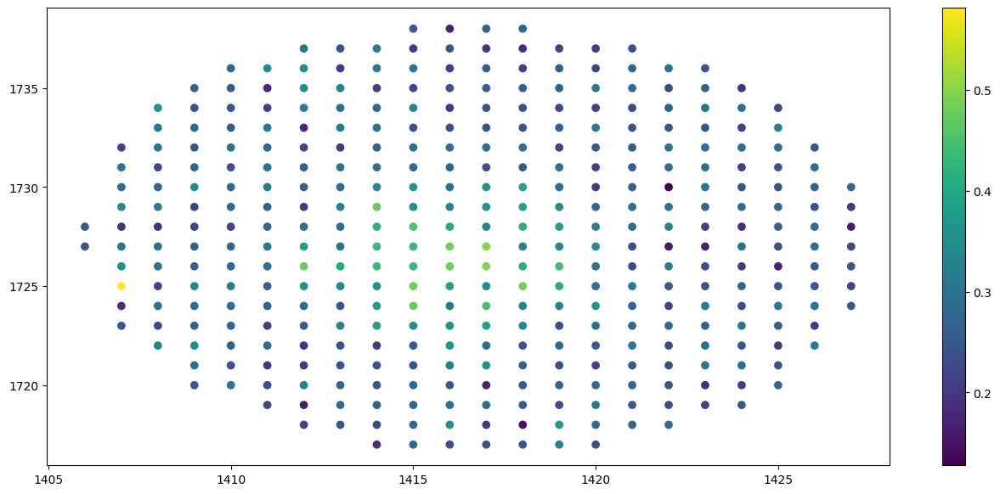

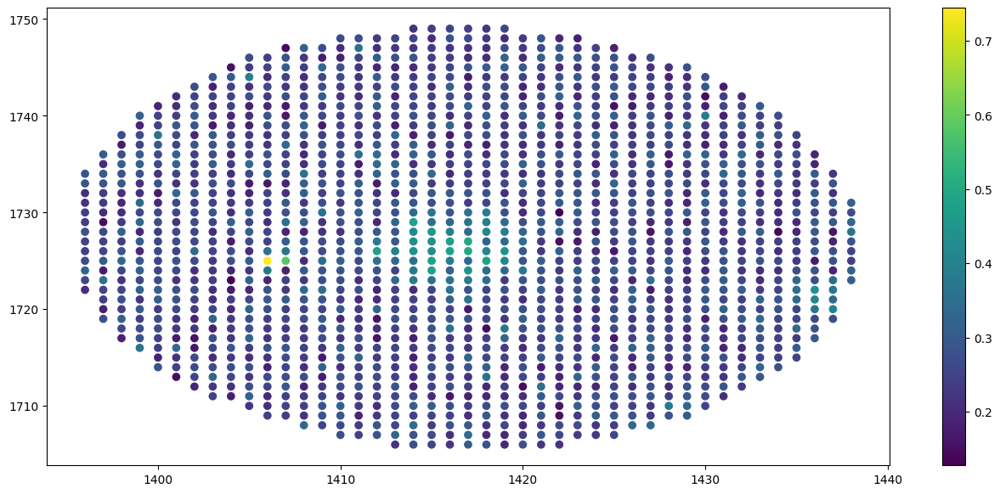

In [252]:
x2,y2 = roman_temp2.seg.nonzero()
x,y = roman_temp.seg.nonzero()
full_img = file[1].data
img1 = []
for xv,yv in zip(x,y):
    img1.append(full_img[xv-100][yv-100])
plt.scatter(x,y,c=img1)#,s=1.)
plt.colorbar()
plt.show()
img2 = []
for xv,yv in zip(x2,y2):
    img2.append(full_img[xv-100][yv-100])
plt.scatter(x2,y2,c=img2)#,s=1.)
plt.colorbar()
plt.show()

#img2 = []
#for ln in img1

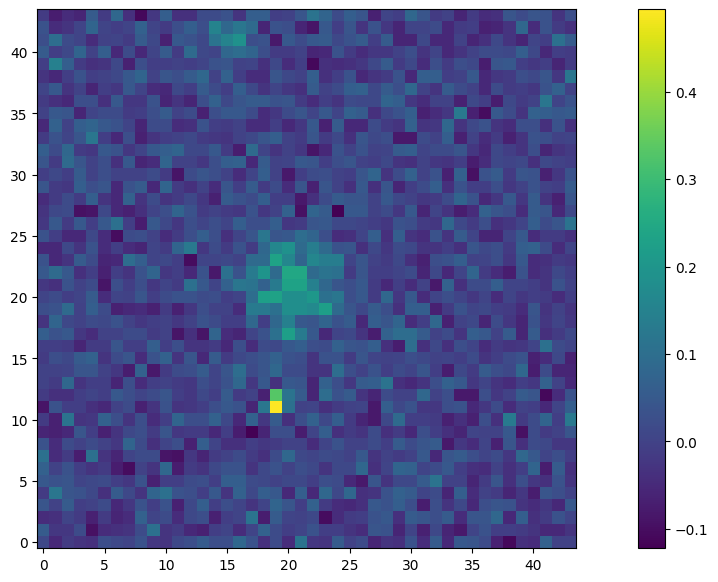

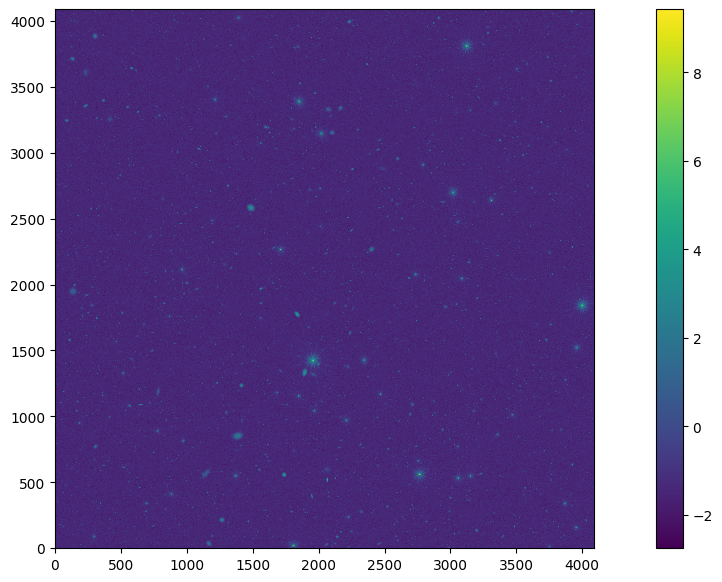

In [251]:
plt.imshow(full_img[y_min2-100:y_max2-100, x_min2-100:x_max2-100]-.25)
plt.colorbar()
plt.show()
plt.imshow(np.log(full_img))#[y_min2-100:y_max2-100, x_min2-100:x_max2-100])
plt.colorbar()
plt.show()

(array([0.000000e+00, 6.210000e+02, 1.015320e+05, 1.818356e+06,
        6.328863e+06, 5.898543e+06, 1.861039e+06, 2.961420e+05,
        7.481100e+04, 4.366100e+04]),
 array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ]),
 <BarContainer object of 10 artists>)

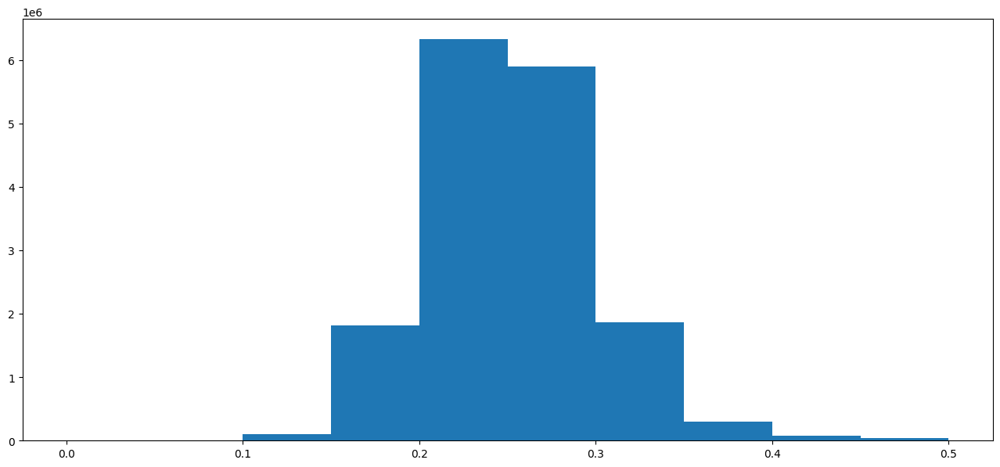

In [247]:
plt.hist(full_img.flatten(),range=(0,.5))

In [ ]:
dx = (-401,600)#np.array([(0,0),(0,1),(1,0),(1,1)]).transpose()#np.zeros(2,2)#np.arange(220)
#dx[1][1] =
dy, lam = roman_temp.conf.get_beam_trace(x=x_0-roman_temp.pad, y=y_0-roman_temp.pad, dx=dx, beam='A')
dy,lam

(array([50.37983089, 34.73385853]), array([20028.98230291,  9258.74125983]))

In [214]:
#~12 angstroms per pixel
minl = 1e4
maxl = 2e4
res = 25
nbin = int((maxl-minl)*1.0001/res)
fluxl = np.zeros(nbin)
npixl = np.zeros(nbin)
segv = roman_temp.seg.nonzero()
for i in range(0,len(segv[0])):
    xp = segv[1][i]
    yp = segv[0][i]
    print(xp,yp)
    for dx1 in range(-400,599):
        dx = (dx1,dx1+1)
        dy, lam = roman_temp.conf.get_beam_trace(x=xp-roman_temp.pad, y=yp-roman_temp.pad, dx=dx, beam='A')
        #print(dx1,dy,lam)
        for lamv,dyv,dxv in zip(lam,dy,dx):
            #print(lamv,dyv,dxv)
            if lamv > minl and lamv < maxl:
                ypf = int(yp+dyv)
                xpf = int(xp+dxv)
                if ypf < len(roman_temp.model[0]) and xpf < len(roman_temp.model[0]):
                    modv = roman_temp.model[ypf][xpf]
                    binv = int((lamv-minl)/res)
                    fluxl[binv] += modv
                    npixl[binv] += 1.
                    #print(lamv,modv,ypf,xpf)
                else:
                    print(segv,ypf,xpf)

1152 3512
1153 3512
1154 3512
1155 3512
1156 3512
1151 3513
1152 3513
1153 3513
1154 3513
1155 3513
1156 3513
1157 3513
1158 3513
1151 3514
1152 3514
1153 3514
1154 3514
1155 3514
1156 3514
1157 3514
1158 3514
1159 3514
1151 3515
1152 3515
1153 3515
1154 3515
1155 3515
1156 3515
1157 3515
1158 3515
1159 3515
1152 3516
1153 3516
1154 3516
1155 3516
1156 3516
1157 3516
1158 3516
1159 3516
1160 3516
1152 3517
1153 3517
1154 3517
1155 3517
1156 3517
1157 3517
1158 3517
1159 3517
1160 3517
1153 3518
1154 3518
1155 3518
1156 3518
1157 3518
1158 3518
1159 3518
1155 3519
1156 3519
1157 3519
1158 3519


400 400


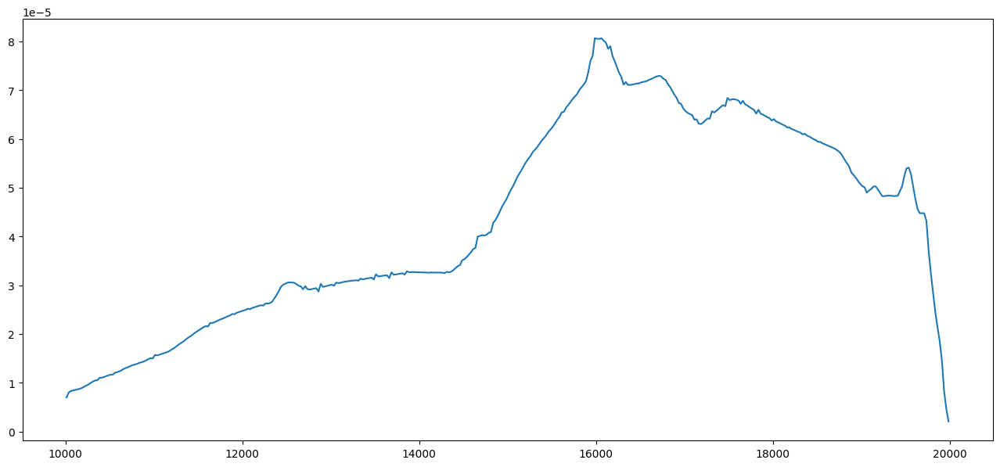

In [215]:
#segv
#len(roman_temp.model[0])

lamv = np.arange(1e4+res/2.,2e4,res)
print(len(lamv),len(fluxl))
plt.plot(lamv,fluxl/npixl)
#fluxl

In [ ]:
#[id][2]['A']
#roman_temp.object_dispersers[104906][2]['A']
#plt.plot(roman_temp.object_dispersers[104906][1][0],roman_temp.object_dispersers[104906][1][1])
id = 104906
#sim, sim.object_dispersers[id]
grizli.model.BeamCutout(roman_temp, roman_temp.object_dispersers[id][2]['A'])#x=x0, y=y0, 
    #                               cutout_dimensions=np.cast[int]((dim, dim)), 
    #                               

ValueError: Out of range in x

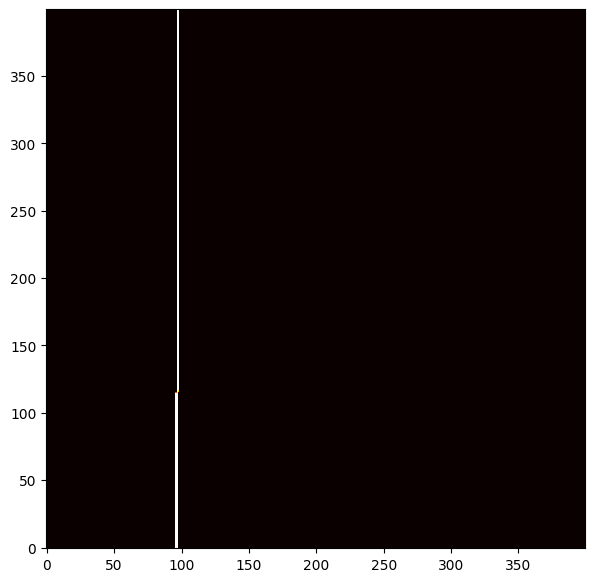

In [ ]:
upright_img_temp[2000][3000] = 1e6
plt.imshow(upright_img_temp[0:400, 3535:3935], vmin=0, vmax=0.0000011738539732765789, cmap="hot")

In [86]:
[x_min,int(x_max), int(y_min),int(y_max)]

[2007, 2100, 1478, 1571]

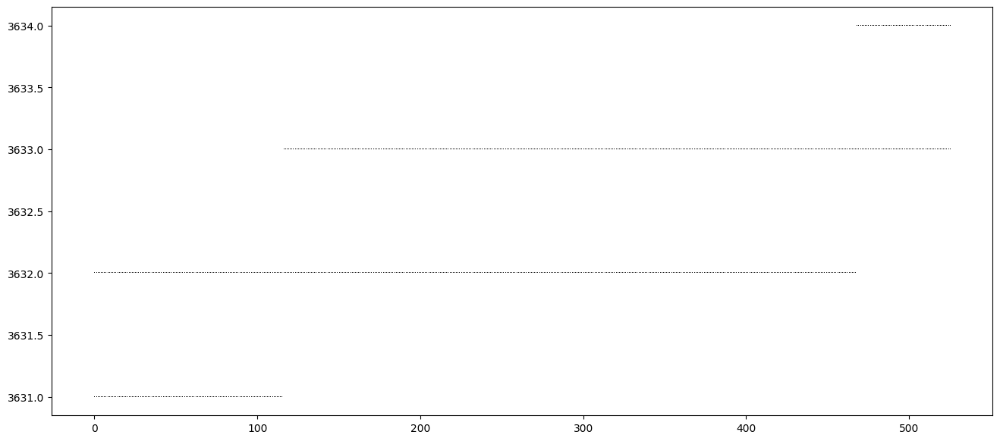

In [ ]:
xl = []
yl = []
for x in range(0,len(upright_img_temp)):
    for y in range(0,len(upright_img_temp)):
        if upright_img_temp[x][y] > 0:
            xl.append(x)
            yl.append(y)
plt.plot(xl,yl,'k,')
plt.show()

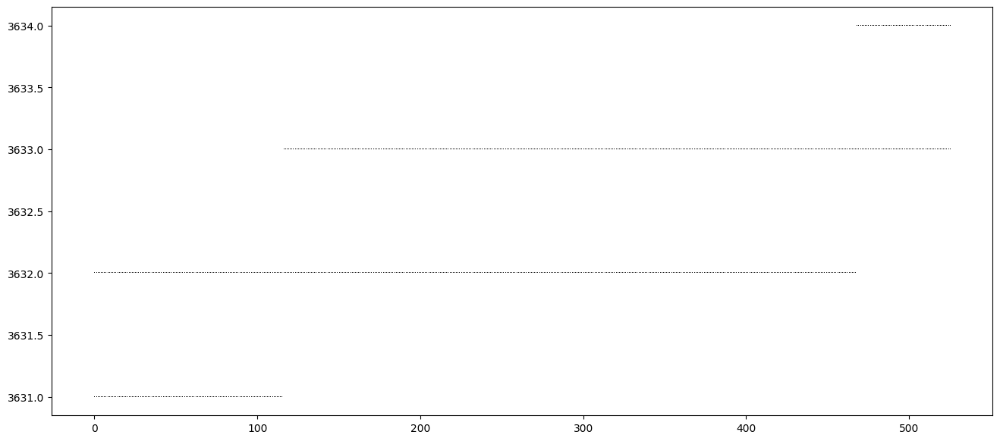

In [89]:
plt.plot(upright_img_temp.nonzero()[0],upright_img_temp.nonzero()[1],'k,')

In [ ]:
import os
from collections import OrderedDict

import matplotlib as mpl    
import matplotlib.pyplot as plt    
import matplotlib.gridspec
mpl.rcParams['figure.figsize'] = (10.0, 6.0)
mpl.rcParams['font.size'] = 14
mpl.rcParams['savefig.dpi'] = 72

import numpy as np

import astropy.io.fits as pyfits
import astropy.wcs as pywcs
from astropy.table import Table
import astropy.time

import drizzlepac
import photutils

import grizli
import grizli.model
import grizli.fake_image

print('\ngrizli version: %s' %(grizli.__version__))
print('Now: ', astropy.time.Time.now().iso)



The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    
The following tasks in the drizzlepac package can be run with TEAL:
    astrodrizzle       config_testbed      imagefindpars           mapreg       
       photeq            pixreplace           pixtopix            pixtosky      
  refimagefindpars       resetbits          runastrodriz          skytopix      
     tweakback            tweakreg           updatenpol

grizli version: 1.11.11
Now:  2024-08-01 13:29:32.338


In [6]:
## Fetch the UDF images from the HLSP pages

if not os.path.exists('hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_sci.fits'):
    print('Fetch XDF images')
    url = 'https://archive.stsci.edu/missions/hlsp/xdf/'
    os.system(f'wget {url}/hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_sci.fits')
    os.system(f'wget {url}/hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_wht.fits')

## SourceExtractor products
if not os.path.exists('hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_seg.fits'):
    print('Fetch demo XDF catalog files')
    os.system('wget https://s3.amazonaws.com/grizli-v1/Demo/xdf-demo-f140w.tar.gz')
    os.system('tar xzvf xdf-demo-f140w.tar.gz')

## Need a WFC3/IR FLT file later
if not os.path.exists('ibhj34h6q_flt.fits'):
    print('Fetch grizli demo files')
    os.system('wget http://www.stsci.edu/~brammer/grism/grizli_demo_data.tar.gz')
    os.system('tar xzvf grizli_demo_data.tar.gz')


Fetch demo XDF catalog files


sh: wget: command not found
tar: Error opening archive: Failed to open 'xdf-demo-f140w.tar.gz'


In [15]:
## Initialize the Grizli object, flt_file is the G141 exposure
pad=120 # allow simulation of objects at the edges
flt = grizli.model.GrismFLT(grism_file='ibhj34h8q_flt.fits', verbose=True, pad=pad,  
                            ref_file='hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_sci.fits')#, 
#                            seg_file='hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_seg.fits')
flt.photutils_detection(detect_thresh=0, grow_seg=5, gauss_fwhm=2.,
                             verbose=True, save_detection=True)

Image cutout: x=slice(509, 4977, None), y=slice(882, 5250, None) [Out of range]
ibhj34h8q_flt.fits / blot reference hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_sci.fits[0]
Using default C-based coordinate transformation...


ImportError: cannot import name 'source_properties' from 'photutils' (/Users/ross.1333/anaconda3/envs/grizli39/lib/python3.9/site-packages/photutils/__init__.py)

In [9]:
# Generate crude configuration files from Pandeia outputs
# Requires pandia.engine and the roman data files
from grizli import GRIZLI_PATH
conf_file = os.path.join(GRIZLI_PATH, 'CONF', 'Roman.det1.07242020.conf')



In [11]:
### Fake images, cendered in the UDF/XDF
ra, dec = 53.1592277508136, -27.782056346146
pa_aper = 128.589

# allow simulation of objects at the edges
pad=0 # pixels

mag_limit = 25 # faint limit for the simulation

EXPTIME = 1.e4 # 10 ks ~ 4 HST orbits
NEXP = 10      # divided between 10 exposures

In [12]:
### Roman/G150 grism.  
h, wcs = grizli.fake_image.roman_header(ra=ra, dec=dec, pa_aper=pa_aper, naxis=(1180,1180))
grizli.fake_image.make_fake_image(h, output='roman.fits', exptime=EXPTIME, nexp=NEXP)

roman = grizli.model.GrismFLT(grism_file='roman.fits', verbose=True, pad=pad,  
                               ref_file='hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_sci.fits', 
                               seg_file='hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_seg.fits')

roman_cat = roman.blot_catalog(ref_cat, sextractor=True) 
roman.catalog = roman_cat

mask = roman_cat['MAG_AUTO'] < mag_limit
print('N=%d' %(mask.sum()))
#wfirst.compute_full_model(compute_beams=['A'], mask=mask, verbose=False)
roman.compute_full_model(ids=roman_cat['NUMBER'][mask], mags=roman_cat['MAG_AUTO'][mask], verbose=True)

 [astropy.io.fits.verify]


Image cutout: x=slice(1275, 4315, None), y=slice(1666, 4706, None)
roman.fits / blot reference hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_sci.fits[0]
Using default C-based coordinate transformation...


FileNotFoundError: [Errno 2] No such file or directory: 'hlsp_xdf_hst_wfc3ir-60mas_hudf_f140w_v1_seg.fits'